# LoRA Without Regret — Educational Adaptation Notebook
## Exploring Key Findings from Schulman & Thinking Machines Lab (Sep 2025)

---

**Notebook type:** Educational / exploratory lab notebook  
**Inspired by:** [LoRA Without Regret](https://thinkingmachines.ai/blog/lora/) blog post  
**Reference repo:** [michaelbzhu/lora-without-regret](https://github.com/michaelbzhu/lora-without-regret)  
**Prerequisites:** Familiarity with LoRA basics (SFT + LoRA concepts)

---

> **"LoRA can match full fine-tuning performance when configured correctly, while using only ~67% of the compute."**  
> — John Schulman & Thinking Machines Lab, September 2025


### What this notebook demonstrates well
- How to set up LoRA fine-tuning with HuggingFace PEFT on a real model
- How rank, alpha, target modules, and learning rate affect training loss
- The qualitative trends described in the "LoRA Without Regret" blog
- How to log experiments to TensorBoard for comparison

### What this notebook does NOT prove
- That LoRA outperforms full fine-tuning (our comparison is hardware-constrained, not controlled)
- That specific numeric thresholds (e.g., the 9.8× LR rule) hold for this model/dataset
- That the blog's findings transfer exactly to our model on Alpaca

### About the model
We use `TinyLlama/TinyLlama-1.1B-intermediate-step-1431k-3T` — an **intermediate training checkpoint** of TinyLlama, saved at step 1.43M of a 3T-token training run. This is **not** the final released TinyLlama model. It is a partially-trained snapshot. We chose it because it is lightweight, publicly available, and sufficient for demonstrating LoRA behavior. Your results will differ with a different checkpoint or model.

> **What's an intermediate checkpoint?** When training a large language model, researchers save snapshots at regular intervals. An intermediate checkpoint is one of these snapshots, taken before training finished. It is a functional model but may not perform as well as the final version. For our purposes — demonstrating LoRA configuration choices — the difference doesn't matter.

### About the LoRA vs FullFT comparison
We run both LoRA and FullFT with reasonable default settings to demonstrate the training pipeline. On our hardware, FullFT operates under tighter memory constraints (smaller micro-batch), which may disadvantage it. The blog's actual finding — that LoRA *matches* FullFT under correct configuration — was established on matched hardware with independently optimized hyperparameters across 14 models. Our comparison here is **illustrative, not conclusive**.


## Table of Contents

1. [Introduction & Scope](#1-introduction)
2. [Recap of LoRA Formulation](#2-lora-recap)
3. [Exploratory Questions](#3-research-questions)
4. [Experimental Infrastructure](#4-infrastructure)
5. [Experiment 1: Rank Scaling](#5-rank-scaling)
6. [Experiment 2: Alpha Scaling](#6-alpha-scaling)
7. [Experiment 3: LoRA vs Full Fine-Tuning](#7-param-efficiency)
8. [Experiment 4: Very Low Rank](#8-low-rank)
9. [Experiment 5: LR Sweep](#9-lora-vs-fullft)
10. [Ablation: Target Modules](#10-ablations)
11. [Dashboard](#11-visualization)
12. [TensorBoard](#12-tensorboard)
13. [Discussion](#13-discussion)
14. [Key Takeaways](#14-takeaways)
15. [References](#15-references)


---
# 1. Introduction & Scope <a id="1-introduction"></a>

The blog post by **John Schulman and Thinking Machines Lab** (September 2025) tested **14 models** (Llama 3 1B–70B, Qwen3 including MoE), **ranks 1–512**, across SFT and RL (GRPO), with datasets including Tulu3, OpenThoughts3, MATH, GSM8K, and DeepMath-103K.

We adapt these experiments for a single Colab GPU:
- **Model:** TinyLlama 1.1B intermediate checkpoint (not the final release)
- **Dataset:** Alpaca-cleaned (3,000 train / 500 eval)
- **Goal:** Observe qualitative trends, not validate exact numbers

| # | Blog claim | What we explore |
|---|-----------|----------------|
| C1 | Rank curves overlap early (1/r scaling) | Rank sweep r={4,8,16,32,64} |
| C2 | Optimal LoRA LR ≈ 10× FullFT LR | LR sweep for both |
| C3 | MLP layers > attention layers for LoRA | Target module ablation |
| C4 | Very low ranks (r=1–4) work for SFT | Low-rank sweep |
| C5 | LoRA matches FullFT under correct config | Demo comparison (not controlled) |


---
# 2. Recap of LoRA Formulation <a id="2-lora-recap"></a>

LoRA replaces each weight matrix W with:

$$W' = W + \frac{\alpha}{r} BA$$

where:
- $W \in \mathbb{R}^{d \times k}$ — frozen pretrained weights
- $B \in \mathbb{R}^{d \times r}$ — initialized to **zero**
- $A \in \mathbb{R}^{r \times k}$ — initialized with Kaiming
- $r$ — rank (bottleneck dimension, $r \ll \min(d, k)$)
- $\alpha$ — scaling factor
- $\gamma = \alpha / r$ — effective scaling (makes LR approximately rank-invariant)

The 1/r prefactor means the learning curve is **nearly identical at training start regardless of rank** — the blog's most striking finding.


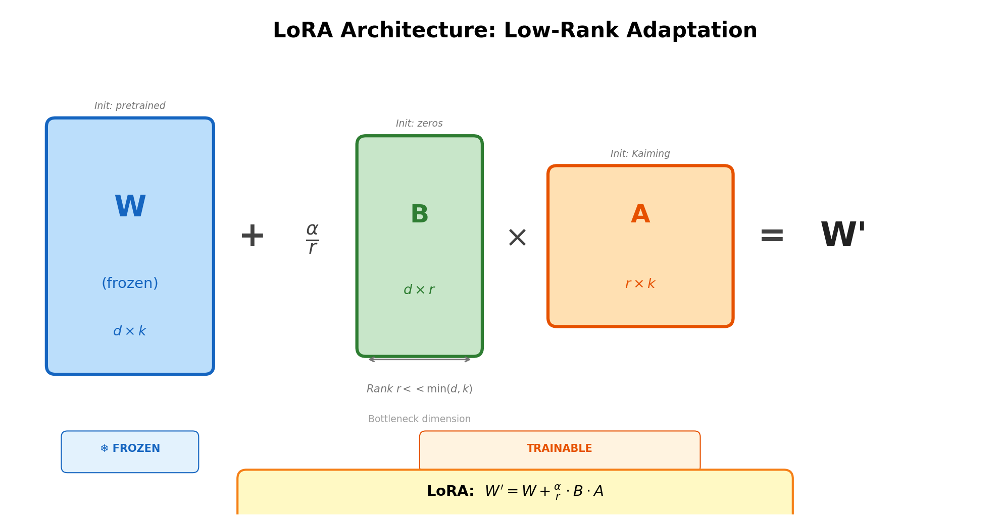

*Figure: LoRA architecture. W (frozen) + (alpha/r) * B * A = W'. Only B and A are trained.*


---
# 3. Exploratory Questions <a id="3-research-questions"></a>

These are **qualitative explorations**, not strict reproductions.

- **EQ1 (Rank):** Do higher ranks improve performance? Do early curves overlap?
- **EQ2 (Alpha):** How does varying α affect training at fixed rank?
- **EQ3 (Efficiency):** How does LoRA performance scale with parameter count?
- **EQ4 (Low Rank):** How well do r=1, 2, 4 perform on SFT?
- **EQ5 (LR Rule):** Does the ~10× LR relationship appear at our scale?
- **EQ6 (Modules):** Does MLP-only outperform attention-only?


---
# 4. Experimental Infrastructure <a id="4-infrastructure"></a>

### Design choices

- **dtype:** Hardware-aware (`float16` on T4, `bfloat16` on Ampere+/Ada)
- **Device:** Explicit `.to(DEVICE)` — no `device_map="auto"`
- **Eval:** Periodic via `eval_strategy="steps"` + post-training `trainer.evaluate()`
- **Labels:** Completion-only masking via marker-search (not separate tokenization)
- **Memory:** `use_cache=False` + gradient checkpointing for FullFT
- **Seeding:** Full deterministic seeding (Python, NumPy, PyTorch, CUDA, Trainer)
- **Trainer:** HuggingFace `Trainer` with `default_data_collator`


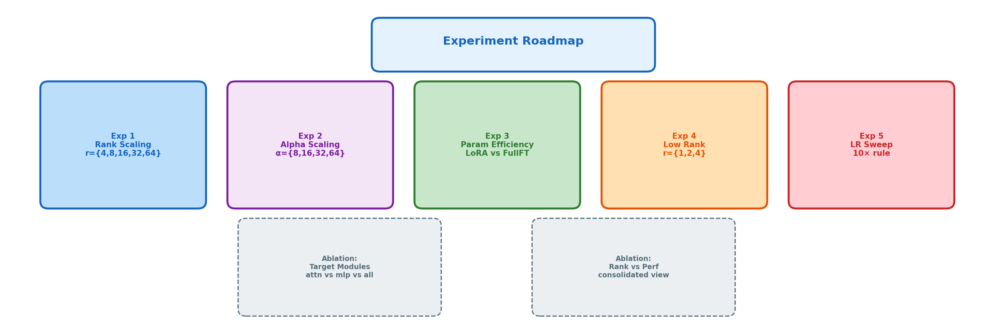

*Figure: Experiment roadmap — 5 core experiments + 2 ablation studies.*


In [ ]:
# ============================================================
# Cell 4.1: Install dependencies (pinned)
# ============================================================
!pip install \
    transformers==4.46.3 \
    trl==0.12.2 \
    peft==0.13.2 \
    datasets==3.1.0 \
    accelerate==1.1.1 \
    tensorboard \
    seaborn \
    -q


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.1/44.1 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.0/10.0 MB 163.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 365.7/365.7 kB 34.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 320.7/320.7 kB 32.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 45.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 333.2/333.2 kB 36.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 21.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 566.4/566.4 kB 52.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 126.6 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2025.3.0 requires fsspec==2025.3.0, but you have fsspec 2024.9.0 which is incompatible.


In [ ]:
!nvidia-smi


Tue Mar 17 20:47:02 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:00:04.0 Off |                    0 |
| N/A   31C    P0             49W /  400W |       0MiB /  40960MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [ ]:
# ============================================================
# Cell 4.2: Imports, GPU detection, and FULL reproducibility seeding
# ============================================================
import torch
import gc
import os
import json
import time
import random
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from dataclasses import dataclass, field, asdict
from typing import List, Optional, Dict, Any

from datasets import load_dataset
from transformers import (
    AutoModelForCausalLM,
    AutoTokenizer,
    TrainingArguments,
    Trainer,
    TrainerCallback,
    default_data_collator,
)
from peft import (
    LoraConfig,
    get_peft_model,
    TaskType,
)
from torch.utils.tensorboard import SummaryWriter

warnings.filterwarnings("ignore", category=FutureWarning)

# --- Full reproducibility seeding (Reviewer Fix #3) ---
SEED = 42

def set_seed(seed=SEED):
    """Set all random seeds for reproducibility.

    Seeds Python, NumPy, PyTorch CPU, and PyTorch CUDA.
    Note: exact reproducibility across different GPU hardware
    or CUDA versions is NOT guaranteed due to floating-point
    nondeterminism in cuBLAS/cuDNN.
    """
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    # Uncomment for strict determinism (~10-20% slower, may error on some ops):
    # torch.backends.cudnn.deterministic = True
    # torch.backends.cudnn.benchmark = False
    # os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":4096:8"
    # torch.use_deterministic_algorithms(True)

set_seed()

# --- Plot defaults ---
sns.set_theme(style="whitegrid", font_scale=1.3)
plt.rcParams.update({
    "figure.figsize": (10, 6), "figure.dpi": 120,
    "axes.titlesize": 16, "axes.labelsize": 14,
    "xtick.labelsize": 12, "ytick.labelsize": 12,
    "legend.fontsize": 11, "font.family": "serif",
})

# --- Hardware-aware dtype (Reviewer Fix: bfloat16 only on Ampere+) ---
if torch.cuda.is_available():
    gpu_name = torch.cuda.get_device_name(0)
    gpu_cap = torch.cuda.get_device_capability(0)
    if gpu_cap[0] >= 8:
        TORCH_DTYPE = torch.bfloat16
        USE_BF16, USE_FP16 = True, False
    else:
        TORCH_DTYPE = torch.float16
        USE_BF16, USE_FP16 = False, True
    print(f"GPU: {gpu_name} (compute {gpu_cap[0]}.{gpu_cap[1]})")
    print(f"VRAM: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")
    print(f"Using dtype: {TORCH_DTYPE}")
else:
    TORCH_DTYPE = torch.float32
    USE_BF16, USE_FP16 = False, False
    print("WARNING: No GPU available.")

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"PyTorch version: {torch.__version__}")
print(f"Seed: {SEED} (Python + NumPy + PyTorch + CUDA)")


GPU: NVIDIA A100-SXM4-40GB (compute 8.0)
VRAM: 42.4 GB
Using dtype: torch.bfloat16
PyTorch version: 2.10.0+cu128
Seed: 42 (Python + NumPy + PyTorch + CUDA)


In [ ]:
%load_ext tensorboard


In [ ]:
# ============================================================
# Cell 4.4: Utilities and result tracking
# ============================================================
def clear_memory():
    gc.collect()
    torch.cuda.empty_cache()
    if torch.cuda.is_available():
        print(f"GPU memory: {torch.cuda.memory_allocated()/1e9:.2f} GB allocated, "
              f"{torch.cuda.memory_reserved()/1e9:.2f} GB reserved")

def count_parameters(model, trainable_only=True):
    if trainable_only:
        return sum(p.numel() for p in model.parameters() if p.requires_grad)
    return sum(p.numel() for p in model.parameters())

def print_trainable_parameters(model):
    trainable = count_parameters(model, True)
    total = count_parameters(model, False)
    pct = 100 * trainable / total
    print(f"Trainable: {trainable:,} / {total:,} ({pct:.4f}%)")
    return trainable, total

@dataclass
class ExperimentResult:
    experiment_name: str
    run_name: str
    lora_rank: Optional[int] = None
    lora_alpha: Optional[int] = None
    lora_target: Optional[str] = None
    learning_rate: float = 0.0
    trainable_params: int = 0
    total_params: int = 0
    param_pct: float = 0.0
    final_train_loss: float = 0.0
    final_eval_loss: float = 0.0
    training_time_seconds: float = 0.0
    loss_history: List[float] = field(default_factory=list)
    eval_loss_history: List[float] = field(default_factory=list)
    step_history: List[int] = field(default_factory=list)

# Pre-initialize all result variables for robustness
ALL_RESULTS: List[ExperimentResult] = []
rank_results: List[ExperimentResult] = []
alpha_results: List[ExperimentResult] = []
low_rank_results: List[ExperimentResult] = []
lora_lr_results: List[ExperimentResult] = []
fullft_lr_results: List[ExperimentResult] = []
target_results: List[tuple] = []
fullft_result: Optional[ExperimentResult] = None

print("Utilities loaded.")


Utilities loaded.


In [ ]:
# ============================================================
# Cell 4.5: Load model and tokenizer
# ============================================================
# NOTE: This is an INTERMEDIATE training checkpoint of TinyLlama,
# saved at step 1.43M of a 3T-token run. It is NOT the final
# released TinyLlama model. We chose it because it's lightweight
# and sufficient for demonstrating LoRA behavior.
MODEL_NAME = "TinyLlama/TinyLlama-1.1B-intermediate-step-1431k-3T"
MAX_SEQ_LENGTH = 512

print(f"Loading tokenizer: {MODEL_NAME}")
print("(This is an intermediate checkpoint, not the final TinyLlama release)")
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME, trust_remote_code=True)
if tokenizer.pad_token is None:
    tokenizer.pad_token = tokenizer.eos_token
    tokenizer.pad_token_id = tokenizer.eos_token_id

print(f"Vocab size: {tokenizer.vocab_size:,}")
print(f"Pad token: '{tokenizer.pad_token}' (id={tokenizer.pad_token_id})")


Loading tokenizer: TinyLlama/TinyLlama-1.1B-intermediate-step-1431k-3T
(This is an intermediate checkpoint, not the final TinyLlama release)


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/776 [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/500k [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/414 [00:00<?, ?B/s]

Vocab size: 32,000
Pad token: '</s>' (id=2)


In [ ]:
# ============================================================
# Cell 4.6: Load and prepare dataset
# ============================================================
print("Loading dataset: yahma/alpaca-cleaned")
dataset = load_dataset("yahma/alpaca-cleaned", split="train")
print(f"Full dataset size: {len(dataset):,}")

TRAIN_SIZE = 3000
EVAL_SIZE = 500

dataset = dataset.shuffle(seed=SEED)
train_dataset = dataset.select(range(TRAIN_SIZE))
eval_dataset = dataset.select(range(TRAIN_SIZE, TRAIN_SIZE + EVAL_SIZE))

print(f"Train: {len(train_dataset):,} | Eval: {len(eval_dataset):,}")
print(f"\nExample: {train_dataset[0]}")


Loading dataset: yahma/alpaca-cleaned


README.md: 0.00B [00:00, ?B/s]

alpaca_data_cleaned.json:   0%|          | 0.00/44.3M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/51760 [00:00<?, ? examples/s]

Full dataset size: 51,760
Train: 3,000 | Eval: 500

Example: {'output': 'Early, she left the party.', 'input': 'She left the party early', 'instruction': 'Rearrange the following sentence to make the sentence more interesting.'}


### Completion-only label masking (robust marker-search approach)

We mask labels so the model is only penalized for predicting **response tokens** — not for "predicting" the instruction template it was given as input. This is standard in SFT.

**Why marker-search instead of separate tokenization?** Tokenizing the prompt alone and the full prompt+response separately can produce different token boundaries at the junction (BPE is context-sensitive). We avoid this by tokenizing the full text once, then scanning for the `### Response:` marker in the token stream to find where the response starts.


In [ ]:
# ============================================================
# Cell 4.7: Tokenization with ROBUST completion-only masking
# ============================================================
# (Reviewer Fix #1: marker-search instead of separate tokenization)
#
# The previous approach tokenized prompt and full-text separately,
# then used len(prompt_tokens) as the mask boundary. This is fragile
# because BPE tokenizers are context-sensitive — the token split at
# the prompt/response boundary can differ between the two calls.
#
# This version tokenizes ONCE, then searches for the response marker
# in the token stream to find the boundary.

RESPONSE_MARKER = "### Response:\n"
MARKER_IDS = tokenizer.encode(RESPONSE_MARKER, add_special_tokens=False)
MARKER_LEN = len(MARKER_IDS)
print(f"Response marker: {repr(RESPONSE_MARKER)}")
print(f"Marker token IDs: {MARKER_IDS} (length {MARKER_LEN})")


def format_alpaca(example):
    """Format Alpaca example into prompt + response."""
    if example.get("input", "").strip():
        prompt = (f"### Instruction:\n{example['instruction']}\n\n"
                  f"### Input:\n{example['input']}\n\n{RESPONSE_MARKER}")
    else:
        prompt = (f"### Instruction:\n{example['instruction']}\n\n{RESPONSE_MARKER}")
    response = example["output"] + tokenizer.eos_token
    return prompt, response


def find_marker_end(input_ids):
    """Find the token index where the response starts (after the marker).

    Strategy 1: Exact subsequence match of marker token IDs.
    Strategy 2 (fallback): Decode progressively until marker string appears.
    Returns len(input_ids) if marker not found (masks entire sequence).
    """
    # Strategy 1: exact subsequence
    for i in range(len(input_ids) - MARKER_LEN + 1):
        if input_ids[i:i + MARKER_LEN] == MARKER_IDS:
            return i + MARKER_LEN

    # Strategy 2: decode-based fallback
    for i in range(1, len(input_ids) + 1):
        decoded = tokenizer.decode(input_ids[:i])
        if RESPONSE_MARKER in decoded:
            return i

    # Marker not found (truncated before response) — mask everything
    return len(input_ids)


def tokenize_function(examples):
    """Tokenize batch with completion-only label masking."""
    all_input_ids, all_attention_mask, all_labels = [], [], []

    for inst, inp, out in zip(examples["instruction"], examples["input"], examples["output"]):
        prompt, response = format_alpaca({"instruction": inst, "input": inp, "output": out})
        full_text = prompt + response

        # Tokenize ONCE — no separate prompt tokenization
        tok = tokenizer(full_text, truncation=True, max_length=MAX_SEQ_LENGTH, padding="max_length")

        # Find where response starts via marker search
        input_ids_raw = tok["input_ids"]
        # Strip padding for marker search
        real_len = sum(tok["attention_mask"])
        response_start = find_marker_end(input_ids_raw[:real_len])

        # Build labels: -100 for prompt + padding
        labels = list(input_ids_raw)
        for j in range(response_start):
            labels[j] = -100
        for j in range(len(labels)):
            if tok["attention_mask"][j] == 0:
                labels[j] = -100

        all_input_ids.append(input_ids_raw)
        all_attention_mask.append(tok["attention_mask"])
        all_labels.append(labels)

    return {"input_ids": all_input_ids, "attention_mask": all_attention_mask, "labels": all_labels}


print("Tokenizing datasets...")
train_tokenized = train_dataset.map(tokenize_function, batched=True, remove_columns=train_dataset.column_names)
eval_tokenized = eval_dataset.map(tokenize_function, batched=True, remove_columns=eval_dataset.column_names)
train_tokenized.set_format("torch")
eval_tokenized.set_format("torch")

print(f"Tokenized: train={len(train_tokenized)}, eval={len(eval_tokenized)}")


Response marker: '### Response:\n'
Marker token IDs: [835, 13291, 29901, 13] (length 4)
Tokenizing datasets...


Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Tokenized: train=3000, eval=500


In [ ]:
# ============================================================
# Cell 4.7b: VALIDATE that completion-only masking is correct
# ============================================================
# This cell decodes the active (non-masked) labels for a few examples
# to verify that only response text appears. If you see ANY instruction
# text here, the masking is broken.

print("=" * 60)
print("MASKING VALIDATION — active labels should be response-only")
print("=" * 60)

for idx in [0, 1, 2]:
    sample = train_tokenized[idx]
    active_ids = [t.item() for t, l in zip(sample["input_ids"], sample["labels"]) if l.item() != -100]
    n_masked = (sample["labels"] == -100).sum().item()
    n_active = len(active_ids)
    n_total = len(sample["labels"])
    print(f"\nExample {idx}: {n_active} active / {n_masked} masked / {n_total} total")
    print(f"Active text: {tokenizer.decode(active_ids)[:200]}")
    # Verify no instruction leakage
    decoded = tokenizer.decode(active_ids)
    assert "### Instruction" not in decoded, f"MASKING BUG: instruction text found in example {idx}!"
    assert "### Input" not in decoded, f"MASKING BUG: input text found in example {idx}!"
    print("  ✓ No instruction/input leakage")

print("\n" + "=" * 60)
print("All masking checks passed.")
print("=" * 60)


MASKING VALIDATION — active labels should be response-only

Example 0: 10 active / 502 masked / 512 total
Active text: Early, she left the party.</s>
  ✓ No instruction/input leakage

Example 1: 146 active / 366 masked / 512 total
Active text: We solve the equation f(x) = 0 on the domains x ≤ 1 and x > 1.

If x ≤ 1, then f(x) = -x - 3, so we want to solve -x - 3 = 0. The solution is x = -3, which satisfies x ≤ 1.

If x > 1, then f(x) = x/2 
  ✓ No instruction/input leakage

Example 2: 26 active / 486 masked / 512 total
Active text: Warm breeze on my face
Endless sun brings joy and peace
Summer, please don't fade</s>
  ✓ No instruction/input leakage

All masking checks passed.


In [ ]:
# ============================================================
# Cell 4.8: TensorBoard callback
# ============================================================
class DetailedTBCallback(TrainerCallback):
    def __init__(self, tb_writer: SummaryWriter, result: ExperimentResult):
        self.tb_writer = tb_writer
        self.result = result
    def on_log(self, args, state, control, logs=None, **kwargs):
        if logs is None: return
        step = state.global_step
        if "loss" in logs:
            self.tb_writer.add_scalar("train/loss", logs["loss"], step)
            self.result.loss_history.append(logs["loss"])
            self.result.step_history.append(step)
        if "eval_loss" in logs:
            self.tb_writer.add_scalar("eval/loss", logs["eval_loss"], step)
            self.result.eval_loss_history.append(logs["eval_loss"])
        if "learning_rate" in logs:
            self.tb_writer.add_scalar("train/learning_rate", logs["learning_rate"], step)
print("Callback defined.")


Callback defined.


### Core training function

Integrates all reviewer fixes:
- **Fix #1:** Uses `default_data_collator` (labels already masked in tokenization)
- **Fix #3:** Calls `set_seed()` before each run; passes `seed` + `data_seed` to `TrainingArguments`
- **Fix #4:** Sets `model.config.use_cache = False`; enables gradient checkpointing for FullFT
- **Fix #5:** `lora_target` stored as string consistently; `ValueError` on unknown target


In [ ]:
# ============================================================
# Cell 4.9: Core training function
# ============================================================
def run_training(
    lora_rank=None, lora_alpha=32, lora_target="all",
    learning_rate=2e-4, num_train_epochs=1,
    per_device_batch_size=4, gradient_accumulation_steps=4,
    run_name="experiment", experiment_name="default",
    logging_steps=10, eval_steps=50,
    use_lora=True, output_base_dir="runs",
):
    # --- Seed for reproducibility (Fix #3) ---
    set_seed(SEED)
    clear_memory()

    # --- Load model (explicit device, no device_map) ---
    model = AutoModelForCausalLM.from_pretrained(
        MODEL_NAME, torch_dtype=TORCH_DTYPE, trust_remote_code=True,
    ).to(DEVICE)

    # --- CRITICAL: disable KV cache for training (Fix #4) ---
    # KV cache is an inference optimization that wastes VRAM during training.
    model.config.use_cache = False

    # --- Configure LoRA or FullFT ---
    if use_lora and lora_rank is not None:
        if isinstance(lora_target, list):
            target_modules = lora_target; target_name = "custom"
        elif lora_target == "attn":
            target_modules = ["q_proj", "v_proj"]; target_name = "attn"
        elif lora_target == "mlp":
            target_modules = ["gate_proj", "up_proj", "down_proj"]; target_name = "mlp"
        elif lora_target == "attn_full":
            target_modules = ["q_proj", "k_proj", "v_proj", "o_proj"]; target_name = "attn_full"
        elif lora_target == "all":
            target_modules = ["q_proj","k_proj","v_proj","o_proj","gate_proj","up_proj","down_proj"]
            target_name = "all"
        else:
            raise ValueError(f"Unknown lora_target: {lora_target}")

        lora_config = LoraConfig(
            r=lora_rank, lora_alpha=lora_alpha, target_modules=target_modules,
            lora_dropout=0.0, bias="none", task_type=TaskType.CAUSAL_LM,
        )
        model = get_peft_model(model, lora_config)
        method_str = f"LoRA(r={lora_rank}, a={lora_alpha}, target={target_name})"
    else:
        # Full fine-tuning
        for param in model.parameters():
            param.requires_grad = True
        # Enable gradient checkpointing for FullFT (Fix #4)
        # Trades ~30% compute for ~50% memory savings — often the
        # difference between OOM and success on constrained GPUs.
        model.gradient_checkpointing_enable(
            gradient_checkpointing_kwargs={"use_reentrant": False}
        )
        method_str = "FullFT"; target_name = "full"; lora_rank = None

    trainable, total = print_trainable_parameters(model)

    # --- TensorBoard ---
    log_dir = os.path.join(output_base_dir, experiment_name, run_name)
    os.makedirs(log_dir, exist_ok=True)
    tb_writer = SummaryWriter(log_dir=log_dir)
    tb_writer.add_text("config/method", method_str)
    tb_writer.add_scalar("config/trainable_params", trainable, 0)

    # --- Result tracker (target stored as string consistently) ---
    result = ExperimentResult(
        experiment_name=experiment_name, run_name=run_name,
        lora_rank=lora_rank, lora_alpha=lora_alpha if use_lora else None,
        lora_target=target_name, learning_rate=learning_rate,
        trainable_params=trainable, total_params=total, param_pct=100*trainable/total,
    )

    # --- Training arguments (with full seeding, Fix #3) ---
    training_args = TrainingArguments(
        output_dir=os.path.join("checkpoints", run_name),
        num_train_epochs=num_train_epochs,
        per_device_train_batch_size=per_device_batch_size,
        per_device_eval_batch_size=per_device_batch_size,
        gradient_accumulation_steps=gradient_accumulation_steps,
        learning_rate=learning_rate,
        lr_scheduler_type="constant", warmup_steps=0,
        logging_steps=logging_steps,
        eval_strategy="steps", eval_steps=eval_steps, eval_on_start=False,
        save_strategy="no",
        bf16=USE_BF16, fp16=USE_FP16,
        report_to="none",
        remove_unused_columns=False,
        dataloader_pin_memory=True,
        seed=SEED,       # Fix #3: seed Trainer internals
        data_seed=SEED,  # Fix #3: seed data loading
    )

    trainer = Trainer(
        model=model, args=training_args,
        train_dataset=train_tokenized, eval_dataset=eval_tokenized,
        data_collator=default_data_collator,
        callbacks=[DetailedTBCallback(tb_writer, result)],
    )

    print(f"\n{'='*60}")
    print(f"Starting: {run_name} | {method_str}")
    print(f"LR: {learning_rate} | Batch: {per_device_batch_size}x{gradient_accumulation_steps}")
    print(f"Params: {trainable:,} ({100*trainable/total:.4f}%) | Log: {log_dir}")
    if not use_lora: print("  [FullFT] gradient_checkpointing=ON, use_cache=OFF")
    print(f"{'='*60}\n")

    start_time = time.time()
    train_result = trainer.train()
    training_time = time.time() - start_time
    eval_result = trainer.evaluate()

    result.final_train_loss = train_result.training_loss
    result.final_eval_loss = eval_result["eval_loss"]
    result.training_time_seconds = training_time

    tb_writer.add_scalar("final/train_loss", result.final_train_loss, 0)
    tb_writer.add_scalar("final/eval_loss", result.final_eval_loss, 0)
    tb_writer.close()
    ALL_RESULTS.append(result)

    print(f"\n--- {run_name} ---")
    print(f"Train: {result.final_train_loss:.4f} | Eval: {result.final_eval_loss:.4f} | Time: {training_time:.1f}s")

    del model, trainer
    clear_memory()
    return result

print("Training function defined.")


Training function defined.


---
# 5. Experiment 1: LoRA Rank Scaling <a id="5-rank-scaling"></a>

> **EQ1:** Do higher LoRA ranks improve performance, and do early training curves overlap?


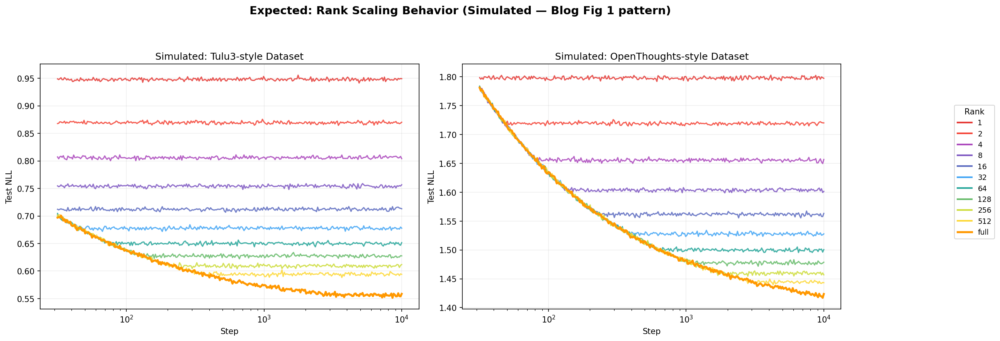

*Expected rank scaling (simulated, Blog Fig 1 pattern). All ranks overlap early; low ranks diverge when capacity-limited.*


In [ ]:
# ============================================================
# Cell 5.1: Experiment 1 — LoRA Rank Scaling
# ============================================================
RANKS_TO_TEST = [4, 8, 16, 32, 64]
print(f"EXPERIMENT 1: Rank Scaling | ranks={RANKS_TO_TEST} | alpha=32, target=all, LR=2e-4")

rank_results = []
for rank in RANKS_TO_TEST:
    result = run_training(
        lora_rank=rank, lora_alpha=32, lora_target="all", learning_rate=2e-4,
        num_train_epochs=1, run_name=f"rank_{rank}", experiment_name="exp1_rank_scaling",
        logging_steps=5, eval_steps=40)
    rank_results.append(result)
print("Experiment 1 complete!")


EXPERIMENT 1: Rank Scaling | ranks=[4, 8, 16, 32, 64] | alpha=32, target=all, LR=2e-4
GPU memory: 0.00 GB allocated, 0.00 GB reserved


config.json:   0%|          | 0.00/560 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/4.40G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/129 [00:00<?, ?B/s]

Trainable: 3,153,920 / 1,103,202,304 (0.2859%)

Starting: rank_4 | LoRA(r=4, a=32, target=all)
LR: 0.0002 | Batch: 4x4
Params: 3,153,920 (0.2859%) | Log: runs/exp1_rank_scaling/rank_4



Step,Training Loss,Validation Loss
40,1.161300,1.219805
80,1.196200,1.200010
120,1.196700,1.189332
160,1.185300,1.186885



--- rank_4 ---
Train: 1.2114 | Eval: 1.1822 | Time: 175.0s
GPU memory: 0.02 GB allocated, 0.04 GB reserved
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Trainable: 6,307,840 / 1,106,356,224 (0.5701%)

Starting: rank_8 | LoRA(r=8, a=32, target=all)
LR: 0.0002 | Batch: 4x4
Params: 6,307,840 (0.5701%) | Log: runs/exp1_rank_scaling/rank_8



Step,Training Loss,Validation Loss
40,1.160600,1.219162
80,1.193900,1.199513
120,1.194700,1.187373
160,1.183100,1.184314



--- rank_8 ---
Train: 1.2101 | Eval: 1.1796 | Time: 170.3s
GPU memory: 0.02 GB allocated, 0.04 GB reserved
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Trainable: 12,615,680 / 1,112,664,064 (1.1338%)

Starting: rank_16 | LoRA(r=16, a=32, target=all)
LR: 0.0002 | Batch: 4x4
Params: 12,615,680 (1.1338%) | Log: runs/exp1_rank_scaling/rank_16



Step,Training Loss,Validation Loss
40,1.160100,1.218839
80,1.194100,1.198673
120,1.193300,1.186669
160,1.182600,1.182619



--- rank_16 ---
Train: 1.2096 | Eval: 1.1779 | Time: 171.0s
GPU memory: 0.02 GB allocated, 0.04 GB reserved
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Trainable: 25,231,360 / 1,125,279,744 (2.2422%)

Starting: rank_32 | LoRA(r=32, a=32, target=all)
LR: 0.0002 | Batch: 4x4
Params: 25,231,360 (2.2422%) | Log: runs/exp1_rank_scaling/rank_32



Step,Training Loss,Validation Loss
40,1.160700,1.218284
80,1.193600,1.198747
120,1.193400,1.186095
160,1.181700,1.182842



--- rank_32 ---
Train: 1.2093 | Eval: 1.1774 | Time: 170.1s
GPU memory: 0.02 GB allocated, 0.04 GB reserved
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Trainable: 50,462,720 / 1,150,511,104 (4.3861%)

Starting: rank_64 | LoRA(r=64, a=32, target=all)
LR: 0.0002 | Batch: 4x4
Params: 50,462,720 (4.3861%) | Log: runs/exp1_rank_scaling/rank_64



Step,Training Loss,Validation Loss
40,1.159900,1.217833
80,1.194200,1.198152
120,1.193100,1.185869
160,1.181700,1.181899



--- rank_64 ---
Train: 1.2091 | Eval: 1.1771 | Time: 169.8s
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Experiment 1 complete!


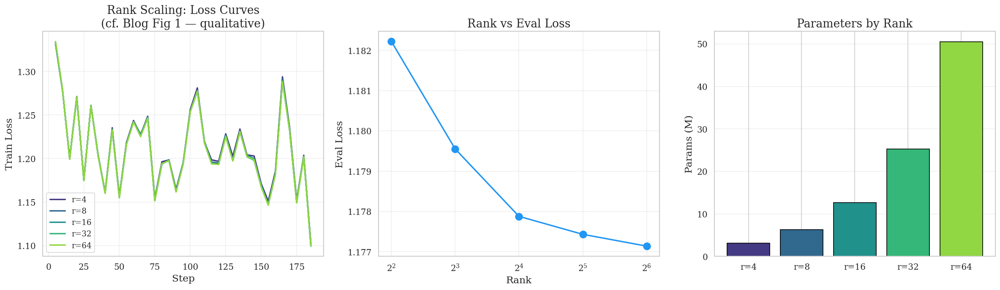

In [ ]:
# ============================================================
# Cell 5.2: Visualize Rank Scaling
# ============================================================
fig, axes = plt.subplots(1, 3, figsize=(20, 6))
colors = sns.color_palette("viridis", len(rank_results))
ax = axes[0]
for i, res in enumerate(rank_results):
    ax.plot(res.step_history, res.loss_history, label=f"r={res.lora_rank}", color=colors[i], linewidth=2)
ax.set_xlabel("Step"); ax.set_ylabel("Train Loss")
ax.set_title("Rank Scaling: Loss Curves\n(cf. Blog Fig 1 — qualitative)"); ax.legend(); ax.grid(True, alpha=0.3)
ax = axes[1]
ax.plot([r.lora_rank for r in rank_results], [r.final_eval_loss for r in rank_results], 'o-', color='#2196F3', linewidth=2, markersize=10)
ax.set_xlabel("Rank"); ax.set_ylabel("Eval Loss"); ax.set_title("Rank vs Eval Loss"); ax.set_xscale("log", base=2); ax.grid(True, alpha=0.3)
ax = axes[2]
ax.bar(range(len(rank_results)), [r.trainable_params/1e6 for r in rank_results], color=colors, edgecolor='black')
ax.set_xticks(range(len(rank_results))); ax.set_xticklabels([f"r={r.lora_rank}" for r in rank_results])
ax.set_ylabel("Params (M)"); ax.set_title("Parameters by Rank"); ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout(); plt.savefig("exp1_rank_scaling.png", dpi=150, bbox_inches='tight'); plt.show()


---
# 6. Experiment 2: Alpha Scaling <a id="6-alpha-scaling"></a>

> **EQ2:** How does α affect training at fixed rank? Blog uses α=32 throughout.


In [ ]:
# ============================================================
# Cell 6.1: Experiment 2 — Alpha Scaling
# ============================================================
ALPHAS_TO_TEST = [8, 16, 32, 64]; FIXED_RANK = 16
print(f"EXPERIMENT 2: Alpha Scaling | alphas={ALPHAS_TO_TEST} | rank={FIXED_RANK}")
alpha_results = []
for alpha in ALPHAS_TO_TEST:
    result = run_training(lora_rank=FIXED_RANK, lora_alpha=alpha, lora_target="all", learning_rate=2e-4,
                          num_train_epochs=1, run_name=f"alpha_{alpha}", experiment_name="exp2_alpha_scaling",
                          logging_steps=5, eval_steps=40)
    alpha_results.append(result)
print("Experiment 2 complete!")


EXPERIMENT 2: Alpha Scaling | alphas=[8, 16, 32, 64] | rank=16
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Trainable: 12,615,680 / 1,112,664,064 (1.1338%)

Starting: alpha_8 | LoRA(r=16, a=8, target=all)
LR: 0.0002 | Batch: 4x4
Params: 12,615,680 (1.1338%) | Log: runs/exp2_alpha_scaling/alpha_8



Step,Training Loss,Validation Loss
40,1.169800,1.228830
80,1.202200,1.209095
120,1.201100,1.196503
160,1.188500,1.191064



--- alpha_8 ---
Train: 1.2192 | Eval: 1.1869 | Time: 170.5s
GPU memory: 0.02 GB allocated, 0.04 GB reserved
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Trainable: 12,615,680 / 1,112,664,064 (1.1338%)

Starting: alpha_16 | LoRA(r=16, a=16, target=all)
LR: 0.0002 | Batch: 4x4
Params: 12,615,680 (1.1338%) | Log: runs/exp2_alpha_scaling/alpha_16



Step,Training Loss,Validation Loss
40,1.163900,1.223481
80,1.197300,1.203958
120,1.197100,1.191541
160,1.185500,1.187423



--- alpha_16 ---
Train: 1.2140 | Eval: 1.1824 | Time: 170.8s
GPU memory: 0.02 GB allocated, 0.04 GB reserved
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Trainable: 12,615,680 / 1,112,664,064 (1.1338%)

Starting: alpha_32 | LoRA(r=16, a=32, target=all)
LR: 0.0002 | Batch: 4x4
Params: 12,615,680 (1.1338%) | Log: runs/exp2_alpha_scaling/alpha_32



Step,Training Loss,Validation Loss
40,1.160200,1.218622
80,1.194200,1.198793
120,1.193300,1.186558
160,1.182800,1.182398



--- alpha_32 ---
Train: 1.2096 | Eval: 1.1780 | Time: 171.3s
GPU memory: 0.02 GB allocated, 0.04 GB reserved
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Trainable: 12,615,680 / 1,112,664,064 (1.1338%)

Starting: alpha_64 | LoRA(r=16, a=64, target=all)
LR: 0.0002 | Batch: 4x4
Params: 12,615,680 (1.1338%) | Log: runs/exp2_alpha_scaling/alpha_64



Step,Training Loss,Validation Loss
40,1.158300,1.214796
80,1.191600,1.194600
120,1.190000,1.184351
160,1.180900,1.181146



--- alpha_64 ---
Train: 1.2070 | Eval: 1.1773 | Time: 171.6s
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Experiment 2 complete!


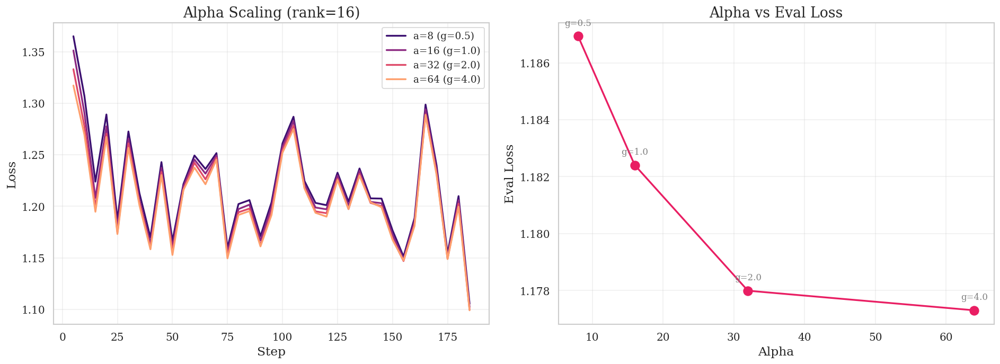

In [ ]:
# Cell 6.2: Visualize Alpha Scaling
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
ca = sns.color_palette("magma", len(alpha_results))
for i, res in enumerate(alpha_results):
    axes[0].plot(res.step_history, res.loss_history, label=f"a={res.lora_alpha} (g={res.lora_alpha/FIXED_RANK:.1f})", color=ca[i], linewidth=2)
axes[0].set_xlabel("Step"); axes[0].set_ylabel("Loss"); axes[0].set_title(f"Alpha Scaling (rank={FIXED_RANK})")
axes[0].legend(); axes[0].grid(True, alpha=0.3)
alphas = [r.lora_alpha for r in alpha_results]; evals = [r.final_eval_loss for r in alpha_results]
axes[1].plot(alphas, evals, 'o-', color='#E91E63', linewidth=2, markersize=10)
for a, l in zip(alphas, evals): axes[1].annotate(f"g={a/FIXED_RANK:.1f}", (a,l), textcoords='offset points', xytext=(0,12), ha='center', fontsize=10, color='gray')
axes[1].set_xlabel("Alpha"); axes[1].set_ylabel("Eval Loss"); axes[1].set_title("Alpha vs Eval Loss"); axes[1].grid(True, alpha=0.3)
plt.tight_layout(); plt.savefig("exp2_alpha_scaling.png", dpi=150, bbox_inches='tight'); plt.show()


---
# 7. Experiment 3: LoRA vs Full Fine-Tuning <a id="7-param-efficiency"></a>

> **EQ3:** How does LoRA performance compare to FullFT on the same data?

### Important: this is a demo comparison, not a controlled experiment

On Colab hardware, FullFT operates under tighter memory constraints than LoRA. Even with gradient checkpointing enabled, the micro-batch size may be smaller. The blog's actual finding — that LoRA *matches* FullFT — was established on matched hardware with independently swept LRs across 14 models. Our comparison is **illustrative only**. If FullFT OOMs, it is skipped entirely — no synthetic baseline is created.


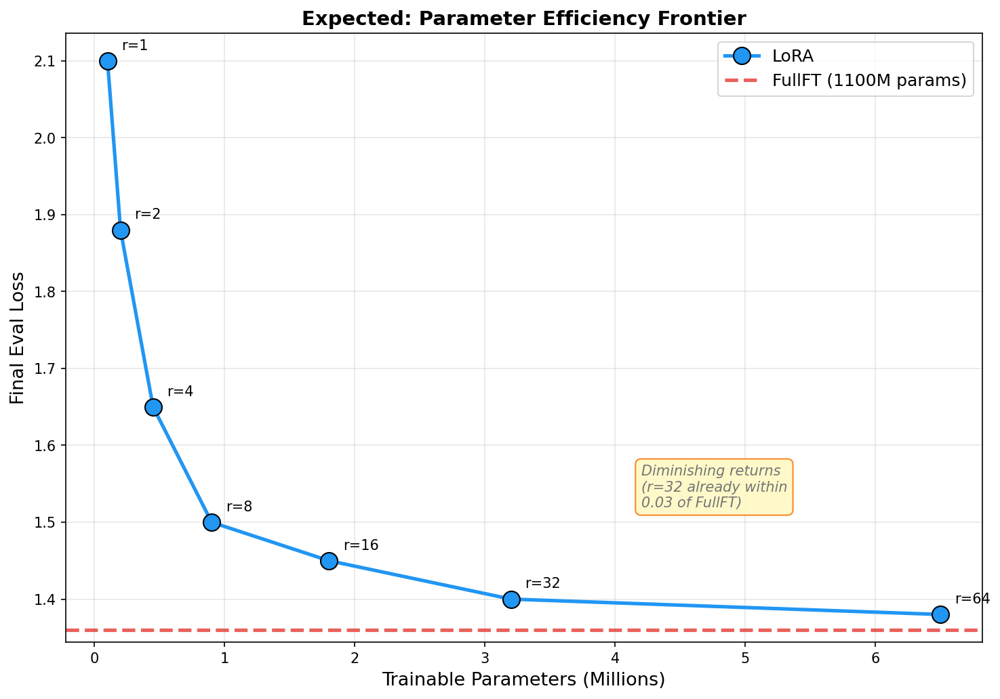

*Expected parameter efficiency frontier (simulated). Diminishing returns beyond r=32.*


In [ ]:
# ============================================================
# Cell 7.1: Full Fine-Tuning baseline (with gradient checkpointing)
# ============================================================
print("EXPERIMENT 3: FullFT baseline (gradient_checkpointing=ON, use_cache=OFF)")
fullft_result = None
try:
    fullft_result = run_training(
        use_lora=False, learning_rate=2e-5, num_train_epochs=1,
        per_device_batch_size=2, gradient_accumulation_steps=8,
        run_name="fullft_baseline", experiment_name="exp3_param_efficiency",
        logging_steps=5, eval_steps=40)
    print(f"FullFT eval loss: {fullft_result.final_eval_loss:.4f}")
except RuntimeError as e:
    if "out of memory" in str(e).lower():
        print("!" * 60)
        print("FullFT OOM. Skipped — no synthetic baseline created.")
        print("Use a larger GPU (L4/A100) to run FullFT.")
        print("!" * 60)
        fullft_result = None; clear_memory()
    else: raise e


EXPERIMENT 3: FullFT baseline (gradient_checkpointing=ON, use_cache=OFF)
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Trainable: 1,100,048,384 / 1,100,048,384 (100.0000%)

Starting: fullft_baseline | FullFT
LR: 2e-05 | Batch: 2x8
Params: 1,100,048,384 (100.0000%) | Log: runs/exp3_param_efficiency/fullft_baseline
  [FullFT] gradient_checkpointing=ON, use_cache=OFF



Step,Training Loss,Validation Loss
40,1.158600,1.220904
80,1.192600,1.201348
120,1.193800,1.189971
160,1.180300,1.182204



--- fullft_baseline ---
Train: 1.2061 | Eval: 1.1793 | Time: 283.5s
GPU memory: 0.15 GB allocated, 0.17 GB reserved
FullFT eval loss: 1.1793


   Method  Params (M)  Eval Loss
 LoRA r=4    3.153920   1.182222
 LoRA r=8    6.307840   1.179552
LoRA r=16   12.615680   1.177878
LoRA r=32   25.231360   1.177432
LoRA r=64   50.462720   1.177140
   FullFT 1100.048384   1.179264


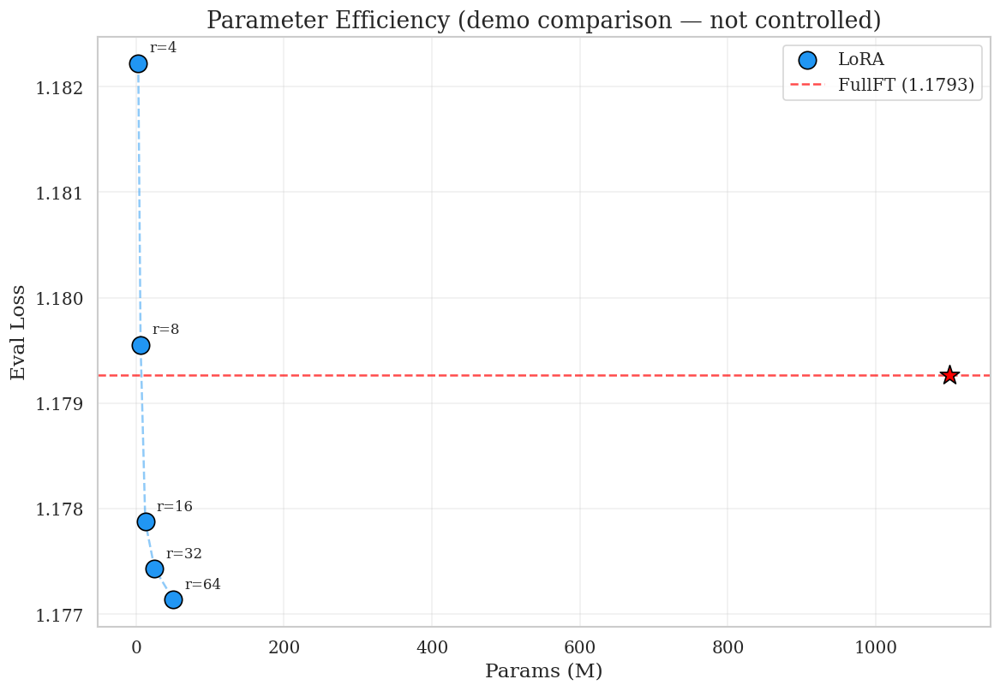

In [ ]:
# Cell 7.2: Parameter Efficiency Plot
eff = [{"Method": f"LoRA r={r.lora_rank}", "Params (M)": r.trainable_params/1e6,
        "Eval Loss": r.final_eval_loss} for r in rank_results]
if fullft_result:
    eff.append({"Method": "FullFT", "Params (M)": fullft_result.trainable_params/1e6, "Eval Loss": fullft_result.final_eval_loss})
df = pd.DataFrame(eff); print(df.to_string(index=False))

fig, ax = plt.subplots(figsize=(10, 7))
ld = df[df["Method"].str.startswith("LoRA")]
ax.scatter(ld["Params (M)"], ld["Eval Loss"], s=150, c='#2196F3', edgecolors='black', zorder=5, label='LoRA')
ax.plot(ld["Params (M)"], ld["Eval Loss"], '--', color='#2196F3', alpha=0.5)
for _, row in ld.iterrows(): ax.annotate(row['Method'].replace('LoRA ',''), (row['Params (M)'],row['Eval Loss']), textcoords='offset points', xytext=(8,8), fontsize=10)
if fullft_result:
    ft = df[df['Method']=='FullFT'].iloc[0]
    ax.axhline(y=ft['Eval Loss'], color='red', linestyle='--', alpha=0.7, label=f'FullFT ({ft["Eval Loss"]:.4f})')
    ax.scatter([ft['Params (M)']], [ft['Eval Loss']], s=200, c='red', marker='*', edgecolors='black', zorder=6)
ax.set_xlabel('Params (M)'); ax.set_ylabel('Eval Loss')
ax.set_title('Parameter Efficiency (demo comparison — not controlled)'); ax.legend(fontsize=12); ax.grid(True, alpha=0.3)
plt.tight_layout(); plt.savefig('exp3_param_efficiency.png', dpi=150, bbox_inches='tight'); plt.show()


---
# 8. Experiment 4: Very Low Rank <a id="8-low-rank"></a>

> **EQ4:** How well do r=1, 2, 4 perform? Same LR as Exp 1 for controlled comparison.


In [ ]:
# Cell 8.1: Low Rank
LOW_RANKS = [1, 2, 4]
print(f"EXPERIMENT 4: Low Rank | ranks={LOW_RANKS} | LR=2e-4 (same as Exp 1)")
low_rank_results = []
for rank in LOW_RANKS:
    result = run_training(lora_rank=rank, lora_alpha=32, lora_target="all", learning_rate=2e-4,
                          num_train_epochs=1, run_name=f"lowrank_{rank}", experiment_name="exp4_low_rank",
                          logging_steps=5, eval_steps=40)
    low_rank_results.append(result)
print("Experiment 4 complete!")


EXPERIMENT 4: Low Rank | ranks=[1, 2, 4] | LR=2e-4 (same as Exp 1)
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Trainable: 788,480 / 1,100,836,864 (0.0716%)

Starting: lowrank_1 | LoRA(r=1, a=32, target=all)
LR: 0.0002 | Batch: 4x4
Params: 788,480 (0.0716%) | Log: runs/exp4_low_rank/lowrank_1



Step,Training Loss,Validation Loss
40,1.166800,1.222144
80,1.201300,1.207338
120,1.200300,1.198874
160,1.193500,1.196988



--- lowrank_1 ---
Train: 1.2175 | Eval: 1.1929 | Time: 168.2s
GPU memory: 0.02 GB allocated, 0.04 GB reserved
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Trainable: 1,576,960 / 1,101,625,344 (0.1431%)

Starting: lowrank_2 | LoRA(r=2, a=32, target=all)
LR: 0.0002 | Batch: 4x4
Params: 1,576,960 (0.1431%) | Log: runs/exp4_low_rank/lowrank_2



Step,Training Loss,Validation Loss
40,1.164400,1.220023
80,1.196300,1.201734
120,1.197300,1.191703
160,1.185700,1.190520



--- lowrank_2 ---
Train: 1.2132 | Eval: 1.1854 | Time: 174.5s
GPU memory: 0.02 GB allocated, 0.04 GB reserved
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Trainable: 3,153,920 / 1,103,202,304 (0.2859%)

Starting: lowrank_4 | LoRA(r=4, a=32, target=all)
LR: 0.0002 | Batch: 4x4
Params: 3,153,920 (0.2859%) | Log: runs/exp4_low_rank/lowrank_4



Step,Training Loss,Validation Loss
40,1.160900,1.220044
80,1.195700,1.200081
120,1.196400,1.189374
160,1.185400,1.187031



--- lowrank_4 ---
Train: 1.2114 | Eval: 1.1820 | Time: 174.0s
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Experiment 4 complete!


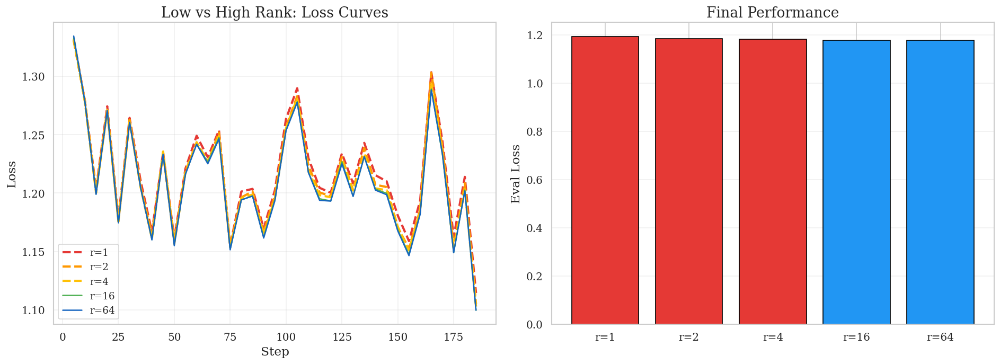

In [ ]:
# Cell 8.2: Low Rank Visualization
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
comb = sorted(low_rank_results + [r for r in rank_results if r.lora_rank in [16,64]], key=lambda x: x.lora_rank)
cl = {'1':'#E53935','2':'#FF9800','4':'#FFC107','16':'#4CAF50','64':'#1565C0'}
for res in comb:
    s = str(res.lora_rank)
    axes[0].plot(res.step_history, res.loss_history, label=f'r={s}', color=cl.get(s,'gray'),
                 linestyle='--' if res.lora_rank<=4 else '-', linewidth=2.5 if res.lora_rank<=4 else 1.5)
axes[0].set_xlabel('Step'); axes[0].set_ylabel('Loss'); axes[0].set_title('Low vs High Rank: Loss Curves')
axes[0].legend(); axes[0].grid(True, alpha=0.3)
rr = [r.lora_rank for r in comb]; ll = [r.final_eval_loss for r in comb]
axes[1].bar(range(len(rr)), ll, color=['#E53935' if r<=4 else '#2196F3' for r in rr], edgecolor='black')
axes[1].set_xticks(range(len(rr))); axes[1].set_xticklabels([f'r={r}' for r in rr])
axes[1].set_ylabel('Eval Loss'); axes[1].set_title('Final Performance'); axes[1].grid(True, alpha=0.3, axis='y')
plt.tight_layout(); plt.savefig('exp4_low_rank.png', dpi=150, bbox_inches='tight'); plt.show()


---
# 9. Experiment 5: LR Sweep <a id="9-lora-vs-fullft"></a>

> **EQ5:** Does the ~10× LR rule hold at our scale? This is a qualitative check, not validation of the 9.8× multiplier.


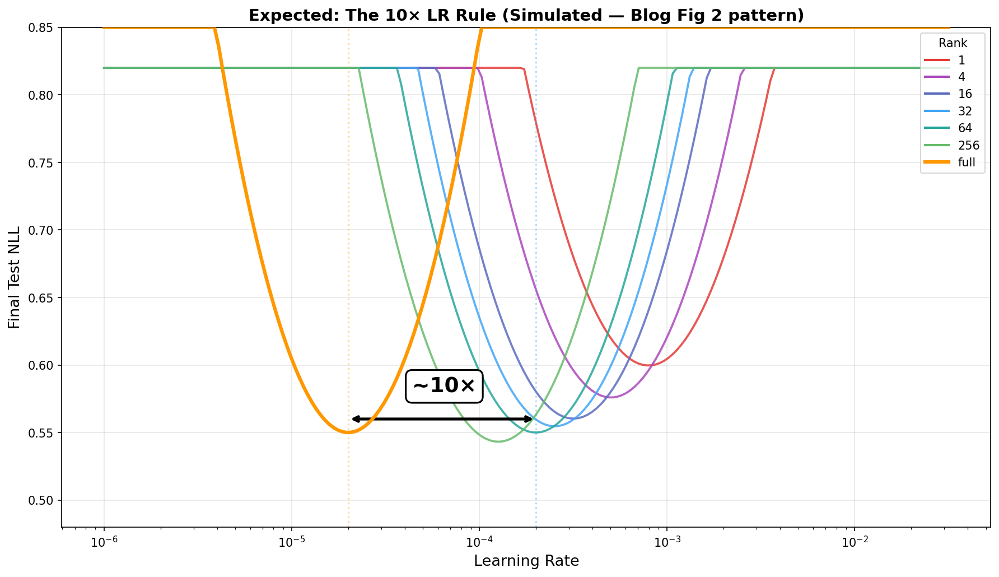

*Expected LR sweep (simulated, Blog Fig 2 pattern). LoRA optimum ~10× higher than FullFT.*


In [ ]:
# Cell 9.1: LR Sweep
LORA_LRS = [5e-5, 1e-4, 2e-4, 5e-4, 1e-3]; FULLFT_LRS = [5e-6, 1e-5, 2e-5, 5e-5]
print(f"EXPERIMENT 5: LR Sweep | LoRA: {LORA_LRS} | FullFT: {FULLFT_LRS}")
lora_lr_results = []
for lr in LORA_LRS:
    lora_lr_results.append(run_training(lora_rank=32, lora_alpha=32, lora_target='all', learning_rate=lr,
        num_train_epochs=1, run_name=f'lora_lr_{lr:.0e}', experiment_name='exp5_lr_sweep', logging_steps=5, eval_steps=40))
fullft_lr_results = []
for lr in FULLFT_LRS:
    try:
        fullft_lr_results.append(run_training(use_lora=False, learning_rate=lr, num_train_epochs=1,
            per_device_batch_size=2, gradient_accumulation_steps=8,
            run_name=f'fullft_lr_{lr:.0e}', experiment_name='exp5_lr_sweep', logging_steps=5, eval_steps=40))
    except RuntimeError as e:
        if 'out of memory' in str(e).lower(): print(f'FullFT OOM at LR={lr}. Skipping.'); clear_memory(); break
        raise e
print('Experiment 5 complete!')


EXPERIMENT 5: LR Sweep | LoRA: [5e-05, 0.0001, 0.0002, 0.0005, 0.001] | FullFT: [5e-06, 1e-05, 2e-05, 5e-05]
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Trainable: 25,231,360 / 1,125,279,744 (2.2422%)

Starting: lora_lr_5e-05 | LoRA(r=32, a=32, target=all)
LR: 5e-05 | Batch: 4x4
Params: 25,231,360 (2.2422%) | Log: runs/exp5_lr_sweep/lora_lr_5e-05



Step,Training Loss,Validation Loss
40,1.180100,1.240777
80,1.211500,1.220897
120,1.209500,1.209077
160,1.195900,1.201106



--- lora_lr_5e-05 ---
Train: 1.2290 | Eval: 1.1962 | Time: 171.0s
GPU memory: 0.02 GB allocated, 0.04 GB reserved
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Trainable: 25,231,360 / 1,125,279,744 (2.2422%)

Starting: lora_lr_1e-04 | LoRA(r=32, a=32, target=all)
LR: 0.0001 | Batch: 4x4
Params: 25,231,360 (2.2422%) | Log: runs/exp5_lr_sweep/lora_lr_1e-04



Step,Training Loss,Validation Loss
40,1.168000,1.227427
80,1.201000,1.208485
120,1.200200,1.195822
160,1.187300,1.190155



--- lora_lr_1e-04 ---
Train: 1.2173 | Eval: 1.1858 | Time: 170.3s
GPU memory: 0.02 GB allocated, 0.04 GB reserved
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Trainable: 25,231,360 / 1,125,279,744 (2.2422%)

Starting: lora_lr_2e-04 | LoRA(r=32, a=32, target=all)
LR: 0.0002 | Batch: 4x4
Params: 25,231,360 (2.2422%) | Log: runs/exp5_lr_sweep/lora_lr_2e-04



Step,Training Loss,Validation Loss
40,1.160400,1.218220
80,1.193900,1.198629
120,1.193800,1.186352
160,1.181600,1.182683



--- lora_lr_2e-04 ---
Train: 1.2094 | Eval: 1.1776 | Time: 170.3s
GPU memory: 0.02 GB allocated, 0.04 GB reserved
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Trainable: 25,231,360 / 1,125,279,744 (2.2422%)

Starting: lora_lr_5e-04 | LoRA(r=32, a=32, target=all)
LR: 0.0005 | Batch: 4x4
Params: 25,231,360 (2.2422%) | Log: runs/exp5_lr_sweep/lora_lr_5e-04



Step,Training Loss,Validation Loss
40,1.157600,1.213262
80,1.196900,1.196301
120,1.194800,1.189620
160,1.186200,1.187189



--- lora_lr_5e-04 ---
Train: 1.2099 | Eval: 1.1855 | Time: 170.6s
GPU memory: 0.02 GB allocated, 0.04 GB reserved
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Trainable: 25,231,360 / 1,125,279,744 (2.2422%)

Starting: lora_lr_1e-03 | LoRA(r=32, a=32, target=all)
LR: 0.001 | Batch: 4x4
Params: 25,231,360 (2.2422%) | Log: runs/exp5_lr_sweep/lora_lr_1e-03



Step,Training Loss,Validation Loss
40,1.185000,1.238201
80,1.238000,1.239543
120,1.240400,1.245357
160,1.245300,1.248060



--- lora_lr_1e-03 ---
Train: 1.2495 | Eval: 1.2551 | Time: 171.0s
GPU memory: 0.02 GB allocated, 0.04 GB reserved
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Trainable: 1,100,048,384 / 1,100,048,384 (100.0000%)

Starting: fullft_lr_5e-06 | FullFT
LR: 5e-06 | Batch: 2x8
Params: 1,100,048,384 (100.0000%) | Log: runs/exp5_lr_sweep/fullft_lr_5e-06
  [FullFT] gradient_checkpointing=ON, use_cache=OFF



Step,Training Loss,Validation Loss
40,1.204100,1.291935
80,1.235400,1.269029
120,1.241200,1.260272
160,1.222500,1.251846



--- fullft_lr_5e-06 ---
Train: 1.2534 | Eval: 1.2461 | Time: 283.2s
GPU memory: 0.15 GB allocated, 0.17 GB reserved
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Trainable: 1,100,048,384 / 1,100,048,384 (100.0000%)

Starting: fullft_lr_1e-05 | FullFT
LR: 1e-05 | Batch: 2x8
Params: 1,100,048,384 (100.0000%) | Log: runs/exp5_lr_sweep/fullft_lr_1e-05
  [FullFT] gradient_checkpointing=ON, use_cache=OFF



Step,Training Loss,Validation Loss
40,1.175800,1.250598
80,1.211600,1.232602
120,1.214900,1.224490
160,1.199800,1.214450



--- fullft_lr_1e-05 ---
Train: 1.2260 | Eval: 1.2084 | Time: 284.3s
GPU memory: 0.15 GB allocated, 0.17 GB reserved
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Trainable: 1,100,048,384 / 1,100,048,384 (100.0000%)

Starting: fullft_lr_2e-05 | FullFT
LR: 2e-05 | Batch: 2x8
Params: 1,100,048,384 (100.0000%) | Log: runs/exp5_lr_sweep/fullft_lr_2e-05
  [FullFT] gradient_checkpointing=ON, use_cache=OFF



Step,Training Loss,Validation Loss
40,1.158700,1.220858
80,1.192600,1.201415
120,1.193500,1.190048
160,1.180100,1.182257



--- fullft_lr_2e-05 ---
Train: 1.2061 | Eval: 1.1790 | Time: 284.4s
GPU memory: 0.15 GB allocated, 0.17 GB reserved
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Trainable: 1,100,048,384 / 1,100,048,384 (100.0000%)

Starting: fullft_lr_5e-05 | FullFT
LR: 5e-05 | Batch: 2x8
Params: 1,100,048,384 (100.0000%) | Log: runs/exp5_lr_sweep/fullft_lr_5e-05
  [FullFT] gradient_checkpointing=ON, use_cache=OFF



Step,Training Loss,Validation Loss
40,1.199400,1.251986
80,1.225600,1.224401
120,1.222800,1.223399
160,1.208000,1.214326



--- fullft_lr_5e-05 ---
Train: 1.2422 | Eval: 1.2104 | Time: 285.0s
GPU memory: 0.15 GB allocated, 0.17 GB reserved
Experiment 5 complete!


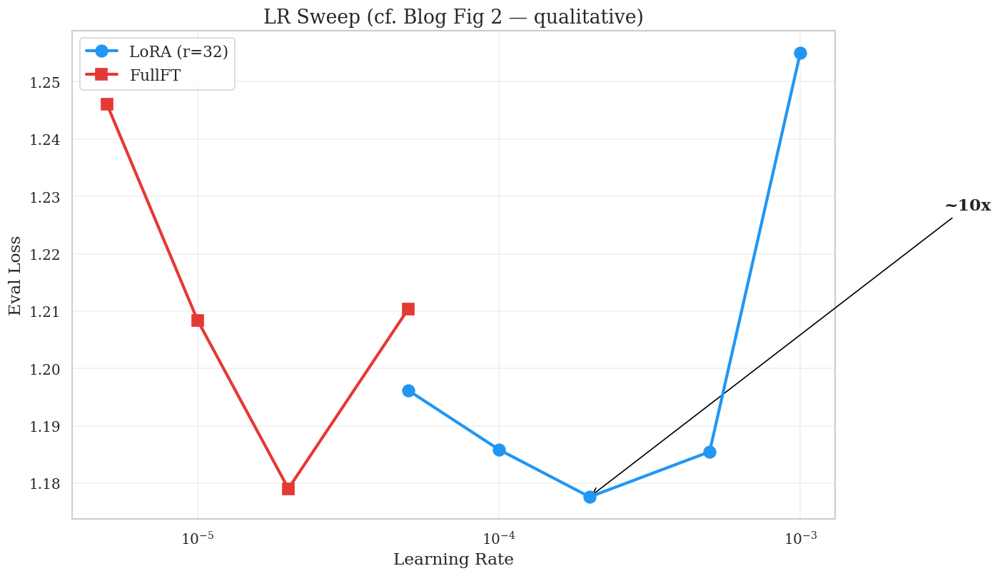

In [ ]:
# Cell 9.2: LR Sweep Visualization
fig, ax = plt.subplots(figsize=(12, 7))
ax.plot([r.learning_rate for r in lora_lr_results], [r.final_eval_loss for r in lora_lr_results],
        'o-', color='#2196F3', linewidth=2.5, markersize=10, label='LoRA (r=32)', zorder=5)
if fullft_lr_results:
    ft_lrs = [r.learning_rate for r in fullft_lr_results]; ft_ls = [r.final_eval_loss for r in fullft_lr_results]
    ax.plot(ft_lrs, ft_ls, 's-', color='#E53935', linewidth=2.5, markersize=10, label='FullFT', zorder=5)
    ratio = [r.learning_rate for r in lora_lr_results][np.argmin([r.final_eval_loss for r in lora_lr_results])] / ft_lrs[np.argmin(ft_ls)]
    ax.annotate(f'~{ratio:.0f}x', xy=([r.learning_rate for r in lora_lr_results][np.argmin([r.final_eval_loss for r in lora_lr_results])],
               min([r.final_eval_loss for r in lora_lr_results])), xytext=(0.003, min([r.final_eval_loss for r in lora_lr_results])+0.05),
               arrowprops=dict(arrowstyle='->', color='black'), fontsize=14, fontweight='bold')
ax.set_xscale('log'); ax.set_xlabel('Learning Rate'); ax.set_ylabel('Eval Loss')
ax.set_title('LR Sweep (cf. Blog Fig 2 — qualitative)'); ax.legend(fontsize=13); ax.grid(True, alpha=0.3)
plt.tight_layout(); plt.savefig('exp5_lr_sweep.png', dpi=150, bbox_inches='tight'); plt.show()


---
# 10. Ablation: Target Modules <a id="10-ablations"></a>

> **EQ6:** Does MLP-only outperform attention-only? Note: parameter counts differ across configs, so this is not apples-to-apples.


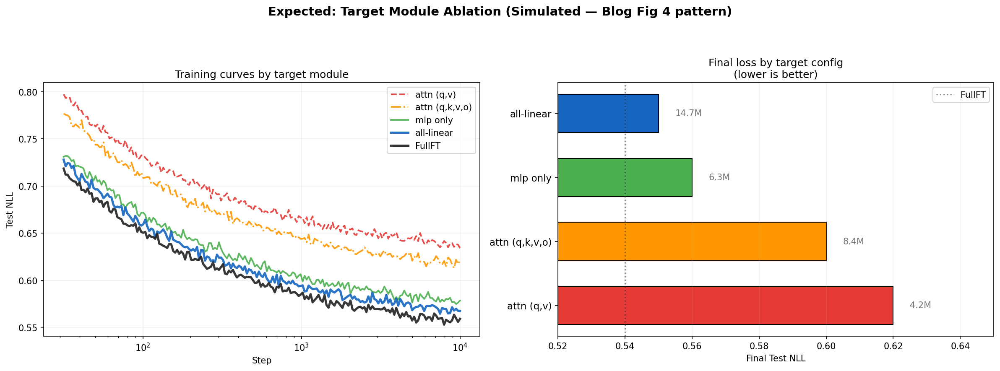

*Expected target module ablation (simulated, Blog Fig 4 pattern). MLP-only outperforms attention-only.*


In [ ]:
# Cell 10.1: Target Module Ablation
TARGET_CONFIGS = {
    'attn_qv': ['q_proj','v_proj'], 'attn_full': ['q_proj','k_proj','v_proj','o_proj'],
    'mlp_only': ['gate_proj','up_proj','down_proj'],
    'all_linear': ['q_proj','k_proj','v_proj','o_proj','gate_proj','up_proj','down_proj'],
}
print(f"ABLATION: Target Modules | configs={list(TARGET_CONFIGS.keys())} | rank=32, alpha=32, LR=2e-4")
target_results = []
for name, mods in TARGET_CONFIGS.items():
    target_results.append((name, run_training(lora_rank=32, lora_alpha=32, lora_target=mods, learning_rate=2e-4,
        num_train_epochs=1, run_name=f'target_{name}', experiment_name='ablation_targets', logging_steps=5, eval_steps=40)))
print('Ablation complete!')


ABLATION: Target Modules | configs=['attn_qv', 'attn_full', 'mlp_only', 'all_linear'] | rank=32, alpha=32, LR=2e-4
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Trainable: 4,505,600 / 1,104,553,984 (0.4079%)

Starting: target_attn_qv | LoRA(r=32, a=32, target=custom)
LR: 0.0002 | Batch: 4x4
Params: 4,505,600 (0.4079%) | Log: runs/ablation_targets/target_attn_qv



Step,Training Loss,Validation Loss
40,1.182400,1.241669
80,1.216800,1.225988
120,1.217000,1.216689
160,1.203500,1.212681



--- target_attn_qv ---
Train: 1.2331 | Eval: 1.2090 | Time: 111.2s
GPU memory: 0.02 GB allocated, 0.04 GB reserved
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Trainable: 9,011,200 / 1,109,059,584 (0.8125%)

Starting: target_attn_full | LoRA(r=32, a=32, target=custom)
LR: 0.0002 | Batch: 4x4
Params: 9,011,200 (0.8125%) | Log: runs/ablation_targets/target_attn_full



Step,Training Loss,Validation Loss
40,1.168900,1.229918
80,1.206600,1.214785
120,1.206600,1.203289
160,1.193200,1.199455



--- target_attn_full ---
Train: 1.2218 | Eval: 1.1951 | Time: 128.1s
GPU memory: 0.02 GB allocated, 0.04 GB reserved
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Trainable: 16,220,160 / 1,116,268,544 (1.4531%)

Starting: target_mlp_only | LoRA(r=32, a=32, target=custom)
LR: 0.0002 | Batch: 4x4
Params: 16,220,160 (1.4531%) | Log: runs/ablation_targets/target_mlp_only



Step,Training Loss,Validation Loss
40,1.161400,1.219941
80,1.196000,1.201242
120,1.195900,1.188320
160,1.184500,1.183729



--- target_mlp_only ---
Train: 1.2117 | Eval: 1.1798 | Time: 126.9s
GPU memory: 0.02 GB allocated, 0.04 GB reserved
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Trainable: 25,231,360 / 1,125,279,744 (2.2422%)

Starting: target_all_linear | LoRA(r=32, a=32, target=custom)
LR: 0.0002 | Batch: 4x4
Params: 25,231,360 (2.2422%) | Log: runs/ablation_targets/target_all_linear



Step,Training Loss,Validation Loss
40,1.160300,1.218103
80,1.193900,1.198769
120,1.193300,1.186148
160,1.181700,1.182908



--- target_all_linear ---
Train: 1.2093 | Eval: 1.1776 | Time: 171.3s
GPU memory: 0.02 GB allocated, 0.04 GB reserved
Ablation complete!


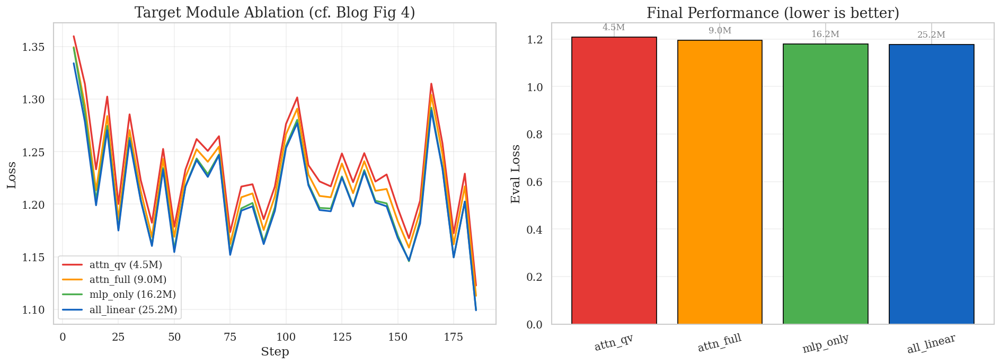

In [ ]:
# Cell 10.2: Target Module Visualization
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
tc = {'attn_qv':'#E53935','attn_full':'#FF9800','mlp_only':'#4CAF50','all_linear':'#1565C0'}
for n, res in target_results:
    axes[0].plot(res.step_history, res.loss_history, label=f'{n} ({res.trainable_params/1e6:.1f}M)', color=tc.get(n,'gray'), linewidth=2)
axes[0].set_xlabel('Step'); axes[0].set_ylabel('Loss'); axes[0].set_title('Target Module Ablation (cf. Blog Fig 4)')
axes[0].legend(); axes[0].grid(True, alpha=0.3)
ns=[n for n,_ in target_results]; ls=[r.final_eval_loss for _,r in target_results]; ps=[r.trainable_params/1e6 for _,r in target_results]
axes[1].bar(range(len(ns)), ls, color=[tc.get(n,'gray') for n in ns], edgecolor='black')
axes[1].set_xticks(range(len(ns))); axes[1].set_xticklabels(ns, rotation=15)
axes[1].set_ylabel('Eval Loss'); axes[1].set_title('Final Performance (lower is better)')
for i,(l,p) in enumerate(zip(ls,ps)): axes[1].annotate(f'{p:.1f}M', (i,l), textcoords='offset points', xytext=(0,8), ha='center', fontsize=10, color='gray')
axes[1].grid(True, alpha=0.3, axis='y')
plt.tight_layout(); plt.savefig('ablation_targets.png', dpi=150, bbox_inches='tight'); plt.show()


## Consolidated Rank vs Performance


 Rank     Eval  Params (M)       Time
    1 1.192916     0.78848 168.182639
    2 1.185430     1.57696 174.504650
    4 1.182030     3.15392 173.973648
    4 1.182222     3.15392 174.966464
    8 1.179552     6.30784 170.346179
   16 1.177878    12.61568 170.975755
   32 1.177432    25.23136 170.094699
   64 1.177140    50.46272 169.828078


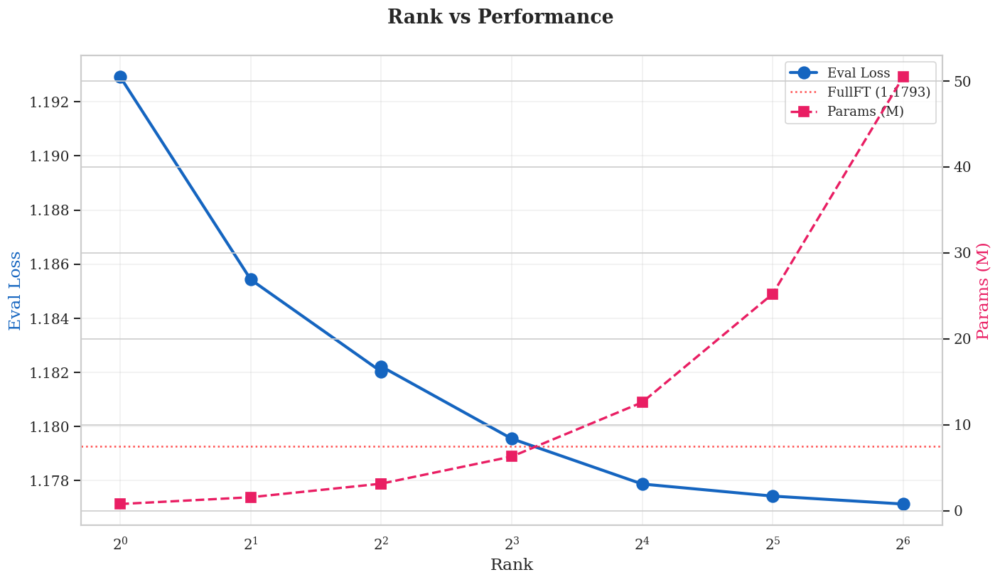

In [ ]:
# Cell 10.3: Consolidated Rank Ablation
all_rd = [{"Rank": r.lora_rank, "Eval": r.final_eval_loss, "Params (M)": r.trainable_params/1e6, "Time": r.training_time_seconds}
          for r in low_rank_results + rank_results]
dfr = pd.DataFrame(all_rd).sort_values('Rank'); print(dfr.to_string(index=False))
fig, ax1 = plt.subplots(figsize=(12, 7))
ax1.plot(dfr['Rank'], dfr['Eval'], 'o-', color='#1565C0', linewidth=2.5, markersize=10, label='Eval Loss')
ax1.set_xlabel('Rank'); ax1.set_ylabel('Eval Loss', color='#1565C0'); ax1.set_xscale('log', base=2)
ax2 = ax1.twinx()
ax2.plot(dfr['Rank'], dfr['Params (M)'], 's--', color='#E91E63', linewidth=2, markersize=8, label='Params (M)')
ax2.set_ylabel('Params (M)', color='#E91E63')
if fullft_result: ax1.axhline(y=fullft_result.final_eval_loss, color='red', linestyle=':', alpha=0.7, label=f'FullFT ({fullft_result.final_eval_loss:.4f})')
fig.suptitle('Rank vs Performance', fontsize=16, fontweight='bold')
l1,lb1 = ax1.get_legend_handles_labels(); l2,lb2 = ax2.get_legend_handles_labels()
ax1.legend(l1+l2, lb1+lb2, loc='upper right'); ax1.grid(True, alpha=0.3)
plt.tight_layout(); plt.savefig('ablation_rank.png', dpi=150, bbox_inches='tight'); plt.show()


---
# 11. Dashboard <a id="11-visualization"></a>


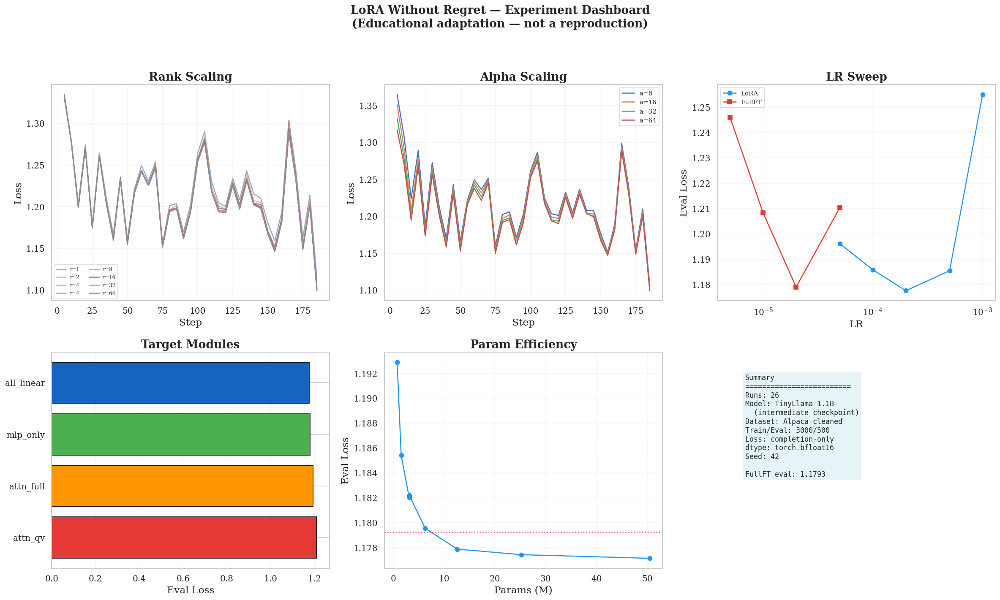

In [ ]:
# Cell 11.1: Master Dashboard
fig = plt.figure(figsize=(20, 12))
fig.suptitle('LoRA Without Regret — Experiment Dashboard\n(Educational adaptation — not a reproduction)', fontsize=16, fontweight='bold', y=0.99)

ax = fig.add_subplot(2, 3, 1)
for res in sorted(low_rank_results+rank_results, key=lambda x: x.lora_rank):
    ax.plot(res.step_history, res.loss_history, label=f'r={res.lora_rank}', alpha=1.0 if res.lora_rank>=16 else 0.6, linewidth=1.5)
ax.set_title('Rank Scaling', fontweight='bold'); ax.set_xlabel('Step'); ax.set_ylabel('Loss'); ax.legend(fontsize=7, ncol=2); ax.grid(True, alpha=0.2)

ax = fig.add_subplot(2, 3, 2)
for res in alpha_results: ax.plot(res.step_history, res.loss_history, label=f'a={res.lora_alpha}', linewidth=1.5)
ax.set_title('Alpha Scaling', fontweight='bold'); ax.set_xlabel('Step'); ax.set_ylabel('Loss'); ax.legend(fontsize=9); ax.grid(True, alpha=0.2)

ax = fig.add_subplot(2, 3, 3)
ax.plot([r.learning_rate for r in lora_lr_results], [r.final_eval_loss for r in lora_lr_results], 'o-', color='#2196F3', label='LoRA')
if fullft_lr_results: ax.plot([r.learning_rate for r in fullft_lr_results], [r.final_eval_loss for r in fullft_lr_results], 's-', color='#E53935', label='FullFT')
ax.set_xscale('log'); ax.set_title('LR Sweep', fontweight='bold'); ax.set_xlabel('LR'); ax.set_ylabel('Eval Loss'); ax.legend(fontsize=9); ax.grid(True, alpha=0.2)

ax = fig.add_subplot(2, 3, 4)
tn=[n for n,_ in target_results]; tl=[r.final_eval_loss for _,r in target_results]
ax.barh(range(len(tn)), tl, color=['#E53935','#FF9800','#4CAF50','#1565C0'][:len(tn)], edgecolor='black')
ax.set_yticks(range(len(tn))); ax.set_yticklabels(tn); ax.set_title('Target Modules', fontweight='bold'); ax.set_xlabel('Eval Loss'); ax.grid(True, alpha=0.2, axis='x')

ax = fig.add_subplot(2, 3, 5)
fr = sorted(low_rank_results+rank_results, key=lambda x: x.trainable_params)
ax.plot([r.trainable_params/1e6 for r in fr], [r.final_eval_loss for r in fr], 'o-', color='#2196F3')
if fullft_result: ax.axhline(y=fullft_result.final_eval_loss, color='red', linestyle=':', alpha=0.7)
ax.set_title('Param Efficiency', fontweight='bold'); ax.set_xlabel('Params (M)'); ax.set_ylabel('Eval Loss'); ax.grid(True, alpha=0.2)

ax = fig.add_subplot(2, 3, 6); ax.axis('off')
txt = f'Summary\n{"="*25}\nRuns: {len(ALL_RESULTS)}\nModel: TinyLlama 1.1B\n  (intermediate checkpoint)\nDataset: Alpaca-cleaned\n'
txt += f'Train/Eval: {TRAIN_SIZE}/{EVAL_SIZE}\nLoss: completion-only\ndtype: {TORCH_DTYPE}\nSeed: {SEED}'
if fullft_result: txt += f'\n\nFullFT eval: {fullft_result.final_eval_loss:.4f}'
else: txt += '\n\nFullFT: skipped (OOM)'
ax.text(0.1, 0.9, txt, transform=ax.transAxes, fontsize=10, va='top', fontfamily='monospace',
        bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.3))
plt.tight_layout(rect=[0,0,1,0.96]); plt.savefig('dashboard.png', dpi=150, bbox_inches='tight'); plt.show()


---
# 12. TensorBoard <a id="12-tensorboard"></a>

All experiments log train loss, eval loss, and LR to TensorBoard.


In [ ]:
%tensorboard --logdir runs


<IPython.core.display.Javascript object>

---
# 13. Discussion <a id="13-discussion"></a>

**Important:** Our setup differs substantially from the blog's. All observations are qualitative.

| Blog claim | What to check in our results |
|-----------|-----------------------------|
| C1: Rank curves overlap early | Do rank scaling plots show early overlap? |
| C2: LoRA LR ~10× FullFT | If FullFT sweep ran, compare optimal LRs |
| C3: MLP > attention | Check target module ablation (note: param counts differ) |
| C4: Low ranks work for SFT | Check r=1,2,4 vs higher ranks |
| C5: LoRA matches FullFT | Demo comparison only — not controlled |

### What we do NOT validate
- Exact 9.8× multiplier (sweep too narrow)
- Batch size sensitivity (not tested)
- Large model scale (70B, MoE)
- RL findings (SFT only)
- The 2/3 FLOP claim (wall-clock ≠ FLOPs)


---
# 14. Key Takeaways <a id="14-takeaways"></a>

### Blog's recommended recipe (from their experiments, not ours)

```python
config = LoraConfig(
    r=32,                         # 256 for production
    lora_alpha=32,
    target_modules="all-linear",  # CRITICAL
    lora_dropout=0.0,
    bias="none",
)
# LR = 10× your_fullft_lr
# Batch size ≤ 32
# Constant LR schedule
```

### Training memory checklist
Always set for LLM training:
1. `model.config.use_cache = False` — disables KV cache (inference-only optimization, wastes VRAM during training)
2. `model.gradient_checkpointing_enable()` — trades ~30% compute for ~50% VRAM savings
3. `set_seed()` before each run — ensures reproducibility across Python, NumPy, PyTorch, CUDA
4. `seed=` and `data_seed=` in `TrainingArguments` — seeds Trainer internals and data loading


---
# 15. References <a id="15-references"></a>

- **Schulman, J. and Thinking Machines Lab.** "LoRA Without Regret." Sep 2025. https://thinkingmachines.ai/blog/lora/
- **michaelbzhu.** GitHub reproduction. https://github.com/michaelbzhu/lora-without-regret
- **HuggingFace.** TRL LoRA Without Regret. https://huggingface.co/docs/trl/main/en/lora_without_regret
- **Hu et al.** "LoRA: Low-Rank Adaptation of Large Language Models." ICLR 2022.
- **Biderman et al.** "LoRA Learns Less and Forgets Less." TMLR 2024.
- **Dettmers et al.** "QLoRA." NeurIPS 2023.
- **Dataset:** yahma/alpaca-cleaned
- **Tools:** HuggingFace PEFT, TRL, TensorBoard


In [ ]:
# Cell 15.1: Save results
results_json = [asdict(r) for r in ALL_RESULTS]
with open('all_experiment_results.json', 'w') as f: json.dump(results_json, f, indent=2)
print(f'Saved {len(ALL_RESULTS)} results')
print('\n' + '='*80 + '\nFINAL SUMMARY\n' + '='*80)
sd = [{'Exp': r.experiment_name, 'Run': r.run_name, 'Rank': r.lora_rank or 'Full',
       'LR': f'{r.learning_rate:.0e}', 'Params (M)': f'{r.trainable_params/1e6:.2f}',
       'Eval': f'{r.final_eval_loss:.4f}', 'Time': f'{r.training_time_seconds:.0f}s'} for r in ALL_RESULTS]
print(pd.DataFrame(sd).to_string(index=False))


Saved 26 results

FINAL SUMMARY
                  Exp               Run Rank    LR Params (M)   Eval Time
    exp1_rank_scaling            rank_4    4 2e-04       3.15 1.1822 175s
    exp1_rank_scaling            rank_8    8 2e-04       6.31 1.1796 170s
    exp1_rank_scaling           rank_16   16 2e-04      12.62 1.1779 171s
    exp1_rank_scaling           rank_32   32 2e-04      25.23 1.1774 170s
    exp1_rank_scaling           rank_64   64 2e-04      50.46 1.1771 170s
   exp2_alpha_scaling           alpha_8   16 2e-04      12.62 1.1869 170s
   exp2_alpha_scaling          alpha_16   16 2e-04      12.62 1.1824 171s
   exp2_alpha_scaling          alpha_32   16 2e-04      12.62 1.1780 171s
   exp2_alpha_scaling          alpha_64   16 2e-04      12.62 1.1773 172s
exp3_param_efficiency   fullft_baseline Full 2e-05    1100.05 1.1793 283s
        exp4_low_rank         lowrank_1    1 2e-04       0.79 1.1929 168s
        exp4_low_rank         lowrank_2    2 2e-04       1.58 1.1854 175s
      

# Addendum: Understanding `gate_proj`, `up_proj`, `down_proj` — The SwiGLU MLP in Modern Transformers

**For:** LoRA Without Regret — Educational Adaptation Notebook (v7)
**Relevant section:** §10 — Ablation: Target Modules
**Prerequisite:** Familiarity with the vanilla Transformer FFN block

---

## Why this addendum exists

In Section 10 of the notebook, Experiment 6 runs a target module ablation with four configurations:

```python
TARGET_CONFIGS = {
    'attn_qv':    ['q_proj', 'v_proj'],
    'attn_full':  ['q_proj', 'k_proj', 'v_proj', 'o_proj'],
    'mlp_only':   ['gate_proj', 'up_proj', 'down_proj'],
    'all_linear': ['q_proj', 'k_proj', 'v_proj', 'o_proj',
                   'gate_proj', 'up_proj', 'down_proj'],
}
```

The blog's claim C3 states that **MLP layers matter more than attention layers for LoRA**. But the notebook doesn't explain *what* `gate_proj`, `up_proj`, and `down_proj` actually are, why there are three of them instead of two, or why the MLP block in TinyLlama (and Llama, Qwen, Mistral, Gemma) looks different from the FFN in GPT-2 or BERT. This addendum fills that gap.

---

## 1. The vanilla Transformer FFN (GPT-2, BERT, T5-original)

The original Transformer FFN is a two-matrix sandwich with a nonlinearity in the middle:

$$W' = \text{ReLU}(x W_1) \cdot W_2$$

where:

- $x \in \mathbb{R}^{d}$ is the hidden state at one position (e.g., $d = 4096$)
- $W_1 \in \mathbb{R}^{d \times d_{ff}}$ **expands** the representation (e.g., $d_{ff} = 4d = 16384$)
- ReLU (or GELU) applies element-wise — zeroing out negative dimensions
- $W_2 \in \mathbb{R}^{d_{ff} \times d}$ **compresses** back to the model dimension

This is a **2-matrix** design. The activation function makes a hard binary decision per dimension: pass (> 0) or kill (≤ 0).

**In HuggingFace code**, these appear as `fc1` / `fc2` or `c_fc` / `c_proj` (GPT-2).

---

## 2. The SwiGLU MLP (Llama, Qwen, Mistral, TinyLlama)

Modern architectures replace the vanilla FFN with a **gated** variant called SwiGLU, introduced in Shazeer (2020). The formula:

$$\text{FFN}_{\text{SwiGLU}}(x) = \big(\text{SiLU}(x W_{\text{gate}}) \odot x W_{\text{up}}\big) \cdot W_{\text{down}}$$

where $\odot$ is element-wise multiplication and SiLU (also called Swish₁) is $\text{SiLU}(x) = x \cdot \sigma(x)$.

This is a **3-matrix** design. The input takes two parallel paths that merge before projecting back down.

### Architecture comparison: vanilla FFN vs. SwiGLU MLP

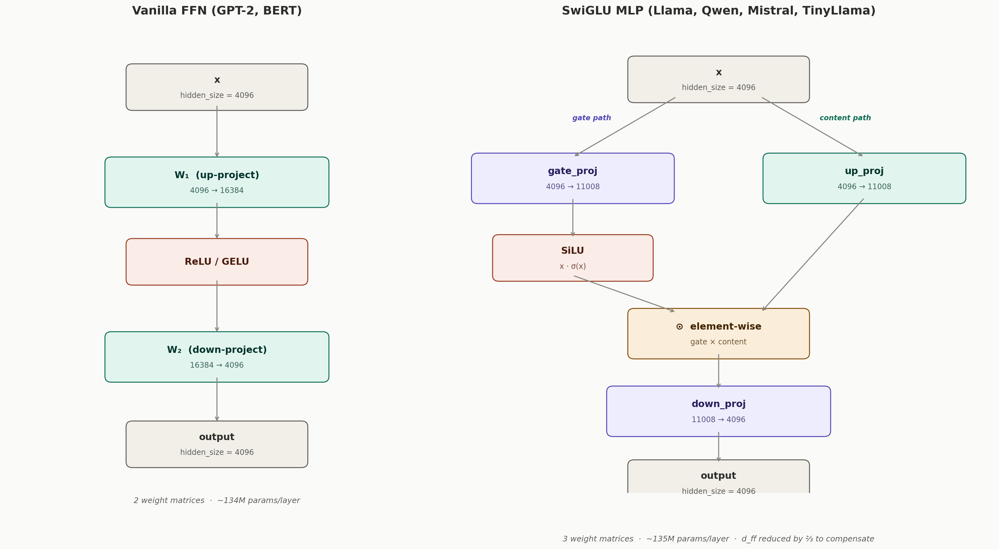

### Mapping names to roles

| HuggingFace name | Weight shape | Role |
|---|---|---|
| `gate_proj` | $d \rightarrow d_{ff}$ | Produces the **gating signal**. After SiLU, each dimension becomes a soft valve (0–1 range) controlling how much of the corresponding `up_proj` dimension passes through. |
| `up_proj` | $d \rightarrow d_{ff}$ | Produces the **content signal** — the actual information that will flow through the network. This is the equivalent of $W_1$ in the vanilla FFN, except it no longer has a nonlinearity applied directly to it. |
| `down_proj` | $d_{ff} \rightarrow d$ | **Compresses** the gated result back to model dimension. Equivalent to $W_2$ in the vanilla FFN. |

---

## 3. Why gating beats a single nonlinearity

In the vanilla FFN, ReLU makes a **binary** per-dimension decision. If the pre-activation is negative, the dimension is dead — zero output, zero gradient. This causes the well-known "dead neuron" problem where some dimensions permanently stop contributing.

The SwiGLU design decouples the decision from the content:

- **`gate_proj` + SiLU** learns *which features matter* for this particular token. SiLU is smooth everywhere (no hard kink at zero), so gradients always flow — no dead neurons.
- **`up_proj`** learns *what information to carry*, unconstrained by the gating nonlinearity.
- The element-wise product `SiLU(gate) ⊙ up` gives the network **continuous, learned suppression** per dimension. Instead of hard 0/1, each dimension is smoothly scaled between 0 and 1.

### Per-dimension gating in action

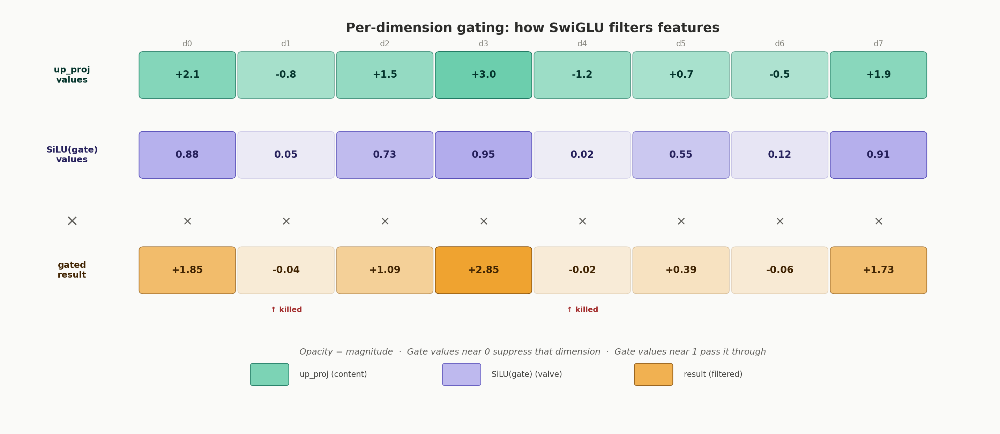

Dimensions d1 and d4 have gate values near zero (0.05 and 0.02) — the network has learned to suppress them for this token. But unlike ReLU, which would hard-zero any negative pre-activation, SiLU provides a **smooth, differentiable** suppression. Gradients still flow through suppressed dimensions, so they can recover in future training steps.

This is analogous to the gating mechanisms in LSTMs (forget gate, input gate), but applied to the FFN sublayer of the Transformer.

---

## 4. Parameter budget: why 3 matrices ≈ 2 matrices

The vanilla FFN uses two matrices of size $d \times 4d$, totaling $2 \times d \times 4d = 8d^2$ parameters.

SwiGLU uses three matrices, but reduces $d_{ff}$ by a factor of $\frac{2}{3}$:

$$d_{ff}^{\text{SwiGLU}} = \frac{2}{3} \times 4d = \frac{8d}{3}$$

Three matrices at the reduced size: $3 \times d \times \frac{8d}{3} = 8d^2$ — identical parameter count.

**Concrete example (Llama 7B):**

| | Vanilla FFN | SwiGLU MLP |
|---|---|---|
| Matrices | 2 ($W_1$, $W_2$) | 3 (`gate_proj`, `up_proj`, `down_proj`) |
| Intermediate size | 16384 ($4 \times 4096$) | 11008 ($\approx 2.68 \times 4096$) |
| Params per layer | $4096 \times 16384 \times 2 \approx 134$M | $4096 \times 11008 \times 3 \approx 135$M |

The 11008 value is $(4 \times 4096 \times 2/3)$ rounded up to a multiple of 256 for hardware-aligned memory access.

---

## 5. Why this matters for LoRA target module selection

When you apply LoRA to a weight matrix $W$, you add a low-rank update $\frac{\alpha}{r} BA$ to it. The effectiveness of LoRA on a given layer depends on **how much task-relevant information flows through that weight matrix**.

The blog's claim C3 — that MLP layers matter more than attention layers for LoRA — has a plausible mechanistic explanation:

1. **MLP layers store factual knowledge.** Research (Geva et al., 2021; Meng et al., 2022) shows that FFN/MLP layers act as key-value memories that store factual associations. Attention layers route information; MLP layers *transform* it. For SFT, where you're teaching the model new behaviors or adapting its knowledge, the MLP layers are where the relevant weights live.

2. **Three targets means more surface area.** With SwiGLU, the MLP block has three projection matrices (`gate_proj`, `up_proj`, `down_proj`) versus four in full attention (`q_proj`, `k_proj`, `v_proj`, `o_proj`). But each MLP matrix is larger ($d \times d_{ff}$ with $d_{ff} = 11008$) compared to attention matrices ($d \times d$ with $d = 4096$ for single-head, or $d \times d_{\text{head}}$ per head). This means LoRA adapters on MLP layers touch a disproportionately large share of the model's total parameters.

3. **The gate learns feature selection.** Applying LoRA to `gate_proj` effectively lets you **retune which features the model activates** for each token — a powerful lever for behavioral adaptation.

### Parameter count comparison for the notebook's ablation

For TinyLlama (hidden_size=2048, intermediate_size=5632, num_heads=32, head_dim=64), at rank $r = 32$:

| Config | Target modules | LoRA params (approx) |
|---|---|---|
| `attn_qv` | `q_proj`, `v_proj` | $2 \times 2 \times 2048 \times 32 \approx 0.26$M |
| `attn_full` | `q_proj`, `k_proj`, `v_proj`, `o_proj` | $4 \times 2 \times 2048 \times 32 \approx 0.52$M |
| `mlp_only` | `gate_proj`, `up_proj`, `down_proj` | $3 \times 2 \times (2048 + 5632) \times 32 / 2 \approx 0.74$M* |
| `all_linear` | All 7 projections | Sum of above $\approx 1.26$M |

*\*MLP LoRA adapters are rectangular ($d \times d_{ff}$), so the A and B matrices have different dimensions: $A \in \mathbb{R}^{r \times d}$ and $B \in \mathbb{R}^{d_{ff} \times r}$, giving $(d + d_{ff}) \times r$ params per adapter.*

This is why the notebook correctly notes: "parameter counts differ across configs, so this is not apples-to-apples." The `mlp_only` config has ~42% more LoRA parameters than `attn_full` despite having fewer target matrices.

---

## 6. From Shazeer (2020): the GLU family tree

The SwiGLU activation used in Llama/TinyLlama is one member of a family of Gated Linear Units explored by Noam Shazeer. The general GLU form:

$$\text{GLU}(x, W, V) = \sigma(xW) \otimes xV$$

Variants replace $\sigma$ (sigmoid) with other nonlinearities:

| Variant | Activation on gate path | FFN formula |
|---|---|---|
| GLU | Sigmoid | $\sigma(xW) \otimes xV \cdot W_2$ |
| Bilinear | None (identity) | $xW \otimes xV \cdot W_2$ |
| ReGLU | ReLU | $\text{ReLU}(xW) \otimes xV \cdot W_2$ |
| GEGLU | GELU | $\text{GELU}(xW) \otimes xV \cdot W_2$ |
| **SwiGLU** | **Swish₁ (SiLU)** | $\text{SiLU}(xW) \otimes xV \cdot W_2$ |

In Shazeer's experiments on T5 (encoder-decoder, 12 layers, $d_{\text{model}} = 768$), **GEGLU and SwiGLU produced the best pre-training perplexities** and outperformed the standard ReLU FFN on GLUE, SuperGLUE, and SQuAD benchmarks — all with matched parameter counts and compute.

The paper famously offers no theoretical explanation:

> "We offer no explanation as to why these architectures seem to work; we attribute their success, as all else, to divine benevolence."
> — Shazeer, 2020

The empirical advantage was sufficient for adoption. PaLM (Google), LLaMA (Meta), Qwen (Alibaba), Mistral, and Gemma all use SwiGLU in their MLP blocks.

---

## 7. Connecting back to the notebook

When you see this in the notebook's Section 10:

```python
'mlp_only': ['gate_proj', 'up_proj', 'down_proj']
```

You now know that:

- **`gate_proj`** — LoRA here adapts the model's learned feature selection. You're retuning *which dimensions get activated* for downstream task tokens.
- **`up_proj`** — LoRA here adapts *what content flows* through the active dimensions. You're reshaping the information that passes the gate.
- **`down_proj`** — LoRA here adapts the compression back to model dimension. You're retuning *how expanded features combine* into the residual stream.

The blog's recommended recipe targets `"all-linear"` (all 7 projections), but understanding the individual roles helps you reason about ablation results and design targeted adaptation strategies.

---

## References

- **Shazeer, N.** "GLU Variants Improve Transformer." arXiv:2002.05202, 2020. https://arxiv.org/abs/2002.05202
- **Dauphin, Y., Fan, A., Auli, M., & Grangier, D.** "Language Modeling with Gated Convolutional Networks." arXiv:1612.08083, 2016.
- **Naoki Shibuya.** "SwiGLU: GLU Variants Improve Transformer (2020)." Blog post, April 2023. https://naokishibuya.github.io/blog/2023-04-30-swiglu-2020/index.html
- **Touvron et al.** "LLaMA: Open and Efficient Foundation Language Models." arXiv:2302.13971, 2023.
- **Geva, M., Schuster, R., Berant, J., & Levy, O.** "Transformer Feed-Forward Layers Are Key-Value Memories." EMNLP, 2021.
- **Meng, K., Bau, D., Andonian, A., & Belinkov, Y.** "Locating and Editing Factual Associations in GPT." NeurIPS, 2022.
- **Hu, E.J., et al.** "LoRA: Low-Rank Adaptation of Large Language Models." ICLR, 2022.
- **Schulman, J. and Thinking Machines Lab.** "LoRA Without Regret." Sep 2025. https://thinkingmachines.ai/blog/lora/